In [1]:
#!/usr/bin/env python
# -*- coding: utf-8 -*-
# ***********************************
# Version: 0.1.1                    #
# Author:  rongboshen               #
# Email:   rongboshen2019@gmail.com #
# Date:    2023.12.12               #
# ***********************************

%matplotlib inline
import os
import numpy as np
import pandas as pd
import scipy.stats as st
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.io as io
import scanpy as sc
from anndata import AnnData
import json
from scipy.cluster.hierarchy import leaves_list
import hotspot
import argparse
from joypy import joyplot
import anndata as ad
import warnings
warnings.filterwarnings("ignore")

In [2]:
def horizontal(array, height=0):
    horizonx = array[:,0]
    horizony = height - array[:,1]
    return np.stack((horizonx, horizony),axis=1)

def verizontal(array, width=0):
    verizonx = width - array[:,0]
    verizony = array[:,1]
    return np.stack((verizonx, verizony),axis=1)

def rotate(array, angle):
    rotatex = math.cos(angle)*array[:,0] - math.sin(angle)*array[:,1]
    rotatey = math.cos(angle)*array[:,1] + math.sin(angle)*array[:,0]
    return np.stack((rotatex, rotatey),axis=1)

def alignment(array):
    minx, maxx, miny, maxy = np.min(array[:,0]), np.max(array[:,0]), np.min(array[:,1]), np.max(array[:,1])
    return array - np.array([minx, miny]), maxx-minx, maxy-miny

def draw_axs_spatial_genes(ax, expression_values, x_locs, y_locs, title, ms, ylabel, title_color):

    ax.set_aspect(1)
    vmin = np.percentile(expression_values, 1)
    vmax = np.percentile(expression_values, 99)

    tmp = sorted(list(zip(expression_values,x_locs,y_locs)))
    expression_values, x_locs, y_locs = list(zip(*tmp))

    sca = ax.scatter(x=x_locs, y=y_locs, s=ms, c=expression_values, vmin=vmin, vmax=vmax, 
                     cmap='jet', edgecolors='none')

    for sp in ax.spines.values():
        sp.set_visible(False)

    ax.set_xticks([])
    ax.set_yticks([])
    if ylabel: ax.set_ylabel(ylabel, fontsize=60, labelpad=10)
    if title: ax.set_title(title, color=title_color, fontsize=60, pad=10)
    return sca, vmin, vmax



def draw_visual_module(adata, sub_save_dir, ext, modules):
    #### Visual SpaGDA imputation result in spatial

    slices = list(set(adata.obs.slice_id))
    slices.sort()
    print("All slices:", slices)
    #load the imputed gene values


    # Plot the modules on top of positions
    fig, axs = plt.subplots(len(modules), 4, figsize=(27,7*len(modules)), gridspec_kw={'hspace':0, 'wspace':0, 'width_ratios':np.array([1,1.6,0.8,1])})
    for i,nslice in enumerate(slices):
        slice_adata = adata[adata.obs.slice_id==nslice, :]
        coords = np.array(slice_adata.obsm['spatial'])
        _coords, _, _ =  alignment(coords)
        if nslice == 'mouse1_slice112':
            _coords, _, _ = alignment(verizontal(horizontal(_coords)))
        elif nslice =='mouse1_slice122' or nslice =='mouse1_slice131':
            _coords, _, _ = alignment(horizontal(_coords))            
        x_locs, y_locs = _coords[:,0], _coords[:,1]
        for j,module in enumerate(modules):
            if j == 0 and i == 0:
                sca, vmin, vmax = draw_axs_spatial_genes(axs[j,i], slice_adata.obs[module], x_locs, y_locs, nslice, 10, module, 'black')
            elif j == 0 and i != 0:
                sca, vmin, vmax = draw_axs_spatial_genes(axs[j,i], slice_adata.obs[module], x_locs, y_locs, nslice, 10, None, 'black')
            elif j != 0 and i == 0:
                sca, vmin, vmax = draw_axs_spatial_genes(axs[j,i], slice_adata.obs[module], x_locs, y_locs, None, 10, module, 'black')
            else:
                sca, vmin, vmax = draw_axs_spatial_genes(axs[j,i], slice_adata.obs[module], x_locs, y_locs, None, 10, None, 'black')

    cb_ax = fig.add_axes([0.4, 0.08, 0.2, 0.06/len(modules)])
    cbar = fig.colorbar(sca, cax=cb_ax, orientation='horizontal')
    cbar.ax.tick_params(labelsize=20)
    cbar.set_ticks([vmin, (vmin+vmax)/2, vmax])
    cbar.set_ticklabels(['low', 'medium', 'high'])#, fontsize=20)

    fig.savefig(os.path.join(sub_save_dir, '%s.pdf'%ext), bbox_inches='tight', dpi=100)
    plt.close()


def local_correlation_plot(local_correlation_z, modules, linkage, save_dir, ext, mod_cmap='tab20', vmin=-8, vmax=8, z_cmap='RdBu_r', yticklabels=False): 
    row_colors = None
    colors = list(plt.get_cmap(mod_cmap).colors)
    module_colors = {i: colors[(i-1) % len(colors)] for i in modules.unique()}
    module_colors[-1] = '#ffffff'

    row_colors1 = pd.Series(
        [module_colors[i] for i in modules],
        index=local_correlation_z.index,
    )

    row_colors = pd.DataFrame({
        "Modules": row_colors1,
    })

    cm = sns.clustermap(local_correlation_z, row_linkage=linkage, col_linkage=linkage, vmin=vmin, vmax=vmax, cmap=z_cmap,
                        xticklabels=False, yticklabels=yticklabels, row_colors=row_colors, rasterized=True, cbar_pos=(1.02, 0.2, 0.03, 0.2))

    

    genes_list = modules.index.to_list()
    module_list = list(modules)
    genes, _modules = [], []
    for ind in cm.dendrogram_row.reordered_ind:
        genes.append(genes_list[ind])
        _modules.append(module_list[ind])

    reorder_df = pd.DataFrame()
    reorder_df['reorder_ind'] = cm.dendrogram_row.reordered_ind
    reorder_df['gene'] = genes
    reorder_df['modules'] = _modules

    reorder_df.to_csv(os.path.join(save_dir, 'modules_reorder.csv'))     
    

    fig = plt.gcf()
    plt.sca(cm.ax_heatmap)
    plt.ylabel("")
    plt.xlabel("")

    cm.ax_row_dendrogram.remove()
    cm.ax_col_dendrogram.remove()

    # Add 'module X' annotations
    ii = leaves_list(linkage)

    mod_reordered = modules.iloc[ii]

    mod_map = {}
    y = np.arange(modules.size)

    for x in mod_reordered.unique():
        if x == -1:
            continue

        mod_map[x] = y[mod_reordered == x].mean()

    plt.sca(cm.ax_row_colors)
    for mod, mod_y in mod_map.items():
        plt.text(-.5, y=mod_y, s="M{}".format(mod), fontsize='xx-large',
                 horizontalalignment='right',
                 verticalalignment='center')
    plt.xticks([])

    # Find the colorbar 'child' and modify
    min_delta = 1e99
    min_aa = None
    for aa in fig.get_children():
        try:
            bbox = aa.get_position()
            delta = (0-bbox.xmin)**2 + (1-bbox.ymax)**2
            if delta < min_delta:
                delta = min_delta
                min_aa = aa
        except AttributeError:
            pass

    min_aa.set_ylabel('Z-Scores')
    min_aa.yaxis.set_label_position("left")
    plt.savefig(os.path.join(save_dir, 'module_local_correlation_%s.pdf'%ext), bbox_inches='tight', dpi=100)


def processing(adata, min_genes=200, min_counts=300, up_filter=False):
    # basic filter.
    print(f"#cells before filter: {adata.n_obs}")
    sc.pp.filter_cells(adata, min_genes=min_genes)
    sc.pp.filter_cells(adata, min_counts=min_counts)
    if up_filter:
        max_counts=np.percentile(adata.X.sum(1),99.0)
        sc.pp.filter_cells(adata, max_counts=max_counts)
    sc.pp.filter_genes(adata, min_cells=10)
    print(f"#cells after basic filter: {adata.n_obs}")

    # QC
    adata.var['mt'] = adata.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
    sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
    adata = adata[adata.obs.pct_counts_mt < 5, :]
    print(f"#cells after MT filter: {adata.n_obs}")

    return adata

def recover_counts(adata, total_counts, median_value):

    #median_value = np.median(total_counts)
    adata_arr = np.exp(adata.X) - 1
    adata_arr = adata_arr / median_value
    adata_arr = np.array(adata_arr, dtype='float32')
    for k,v in enumerate(list(total_counts)):
        adata_arr[k] = adata_arr[k] * v

    adata_arr = np.around(adata_arr)
    adata_arr = adata_arr.astype(np.int32)
    resemble_total_counts = np.sum(adata_arr, axis=1)
    adata.layers['counts'] = adata_arr
    adata.obs['total_counts'] = resemble_total_counts

    filter_genes = adata.var_names[np.sum(adata_arr, axis=0)==0]
    adata = adata[:,~adata.var_names.isin(list(filter_genes))]
    prd_adata = adata.copy()
    adata.X = adata.layers['counts']

    return adata, prd_adata


def draw_umap2(post_adata, res_adata, shared_genes, save_dir, ext):
    sc.settings.figdir = save_dir
    post_adata.obs['cell_type'] = post_adata.obs['ct_name'].replace(['Differentiating SPG'], ['SPG'])
    res_adata.obs['cell_type'] = res_adata.obs['ct_name'].replace(['Differentiating SPG'], ['SPG'])

    print('post_adata shape:', post_adata.shape)
    print('res_adata shape:', res_adata.shape)
    post_adata.obs['Measured vs. Imputed'] = 'Measured'
    res_adata.obs['Measured vs. Imputed'] = 'Imputed'

    spectrum_cell_types = ['ES', 'RS', 'SPC', 'SPG']
    #color_palette = {'ES': 'limegreen', 'RS': 'darkcyan', 'SPC': 'purple', 'SPG': 'skyblue'}    
    color_palette2 = {'Measured': '#0ebeff', 'Imputed': '#d36746'} 

    color_palette = {'Macrophage': 'lightcyan', 'Endothelial': 'brown', 'Myoid' : 'red', 'Leydig': 'gray', 'Sertoli': 'orange',  
                     'SPG': 'skyblue', 'SPC': 'purple', 'RS': 'darkcyan', 'ES': 'limegreen', 'unassigned': 'lightgray'}

    #post_adata = post_adata[post_adata.obs.cell_type.isin(spectrum_cell_types), ~post_adata.var_names.isin(shared_genes)] #
    #res_adata = res_adata[res_adata.obs.cell_type.isin(spectrum_cell_types), ~res_adata.var_names.isin(shared_genes)] #
    print('post_adata shape:', post_adata.shape)
    print('res_adata shape:', res_adata.shape)

    merged_adata = ad.concat([post_adata, res_adata], join='outer')
    print('merged_adata shape:', merged_adata.shape)
    sc.pp.normalize_total(merged_adata)
    sc.pp.log1p(merged_adata)

    sc.pp.pca(merged_adata, n_comps=100)
    sc.pp.neighbors(merged_adata)
    sc.tl.umap(merged_adata)
    sc.pl.umap(merged_adata, color='cell_type', palette=color_palette, legend_fontsize='x-small', save='_%s_merged_celltype.pdf'%ext)
    sc.pl.umap(merged_adata, color='Measured vs. Imputed', palette=color_palette2, legend_fontsize='x-small', save='_%s_merged_src2res.pdf'%ext)

def deg_analysis(adata, name, shared_genes, save_dir, gene_set):
    sc.settings.figdir = save_dir
    adata.obs['cell_type'] = adata.obs['ct_name'].replace(['Differentiating SPG'], ['SPG'])

    #sc.pp.normalize_total(adata)
    #sc.pp.log1p(adata)
    print('adata shape:', adata.shape)
    spectrum_cell_types = ['ES', 'RS', 'SPC', 'SPG']
    adata = adata[adata.obs.cell_type.isin(spectrum_cell_types), :]
    adata = adata[:, ~adata.var_names.isin(shared_genes)]
    print('sperm adata shape:', adata.shape)

    sc.tl.rank_genes_groups(adata, groupby='cell_type', method='wilcoxon') #
    sc.pl.rank_genes_groups_dotplot(adata, n_genes=10, save='_%s.pdf'%name)
    sc.tl.filter_rank_genes_groups(adata, min_in_group_fraction=0.25, max_out_group_fraction=0.5, min_fold_change=1)
    sc.pl.rank_genes_groups_dotplot(adata, n_genes=10, key='rank_genes_groups_filtered', dendrogram=True, save='_filter_%s.pdf'%name)

    gene_set = [x for x in gene_set if x in adata.var_names]
    gene_set = [x for x in gene_set if x not in shared_genes]
    sc.pl.dotplot(adata, gene_set, groupby='cell_type', dendrogram=True, save='_gs_%s.pdf'%name)


def pair_deg_analysis(adata1, adata2, shared_genes, save_dir, ext, filter_shared=False):
    sc.settings.figdir = save_dir
    adata1.obs['From'] = ['Wild']*adata1.shape[0]
    adata2.obs['From'] = ['Diabete']*adata2.shape[0]
    merged_adata = ad.concat([adata1, adata2], join='inner')

    if filter_shared:
        merged_adata = merged_adata[:,~merged_adata.var_names.isin(shared_genes)]
    print('merged adata shape:', merged_adata.shape)
    sc.pp.normalize_total(merged_adata)
    sc.pp.log1p(merged_adata)


    sc.tl.rank_genes_groups(merged_adata, groupby='From', method='wilcoxon')#
    sc.pl.rank_genes_groups_dotplot(merged_adata, n_genes=5, dendrogram=False, save='%s.pdf'%ext)

    gene_list = [x[0] for x in merged_adata.uns['rank_genes_groups']['names']]
    deg_df = pd.DataFrame(index=gene_list, columns=['qvals', 'logfoldchanges'])
    deg_df['qvals'] = [-np.log10(x[0]) for x in merged_adata.uns['rank_genes_groups']['pvals_adj']]
    deg_df['logfoldchanges'] = [x[0] for x in merged_adata.uns['rank_genes_groups']['logfoldchanges']]

    sc.tl.filter_rank_genes_groups(merged_adata, min_in_group_fraction=0.25, max_out_group_fraction=0.5, min_fold_change=1)
    sc.pl.rank_genes_groups_dotplot(merged_adata, n_genes=5, key='rank_genes_groups_filtered', dendrogram=False, save='filter_%s.pdf'%ext)


    merged_adata.obs['cell_type'] = merged_adata.obs['ct_name'].replace(['Differentiating SPG'], ['SPG'])
    spectrum_cell_types = ['ES', 'RS', 'SPC', 'SPG']
    for cell_t in spectrum_cell_types:
        sub_adata = merged_adata[merged_adata.obs.cell_type==cell_t, :]

        sc.tl.rank_genes_groups(sub_adata, groupby='From', method='wilcoxon')#
        sc.pl.rank_genes_groups_dotplot(sub_adata, n_genes=5, dendrogram=False, save='%s_%s.pdf'%(ext, cell_t))

    return deg_df


def spatial_pattern_analysis(adata, save_dir, ext, neighbors=30, min_genes=30, fdr=0.05, core=True):

    #adata_raw = adata.copy()
    #sc.pp.normalize_total(adata_raw)
    #sc.pp.log1p(adata_raw)

    adata.layers['counts'] = adata.X
    filter_genes = adata[:, np.sum(adata.X, axis=0) == 0].var_names.tolist()
    adata = adata[:, ~adata.var_names.isin(filter_genes)]
    adata.obs['total_counts'] = list(np.sum(adata.X, axis=1))


    hs = hotspot.Hotspot(adata, layer_key='counts', model='danb', latent_obsm_key='spatial', umi_counts_obs_key='total_counts')
    hs.create_knn_graph(weighted_graph=False, n_neighbors=neighbors)
    hs_results = hs.compute_autocorrelations()
    hs_genes = hs_results.loc[hs_results.FDR < 0.05].index
    local_correlations = hs.compute_local_correlations(hs_genes, jobs=8)
    modules = hs.create_modules(min_gene_threshold=min_genes, core_only=core, fdr_threshold=fdr)

    module_scores = hs.calculate_module_scores()

    local_correlation_plot(local_correlation_z=hs.local_correlation_z, modules=hs.modules, linkage=hs.linkage, save_dir=save_dir, ext=ext)

    for module in range(1, hs.modules.max()+1):
        adata.obs['M%d'%module] = hs.module_scores[module]

    # Plot the module scores on top of positions
    coords = np.array(adata.obsm['spatial'])
    _coords, _, _ =  alignment(coords)
    x_locs, y_locs = _coords[:,0], _coords[:,1]

    fig, axs = plt.subplots(1, hs.modules.max(), figsize=(5*hs.modules.max(),7), gridspec_kw={'hspace':0.0, 'wspace':0.1})
    for j, module in enumerate(['M%d'%x for x in range(1, hs.modules.max()+1)]):
        sca, vmin, vmax = draw_axs_spatial_genes(axs[j], adata.obs[module], x_locs, y_locs, module, 2, None, 'black')

    cb_ax = fig.add_axes([0.91, 0.35, 0.01, 0.3])
    cbar = fig.colorbar(sca, cax=cb_ax)
    cbar.ax.tick_params(labelsize=15)
    cbar.set_ticks([vmin, (vmin+vmax)/2, vmax])
    cbar.set_ticklabels(['low', 'medium', 'high'])#, fontsize=15)
    fig.savefig(os.path.join(save_dir, 'spatial_modules_%s.pdf'%ext), bbox_inches='tight', dpi=100)
    plt.close()


    # Plot top 2 genes in selected modules
    adata.X = adata.layers['counts']
    results = hs.results.join(hs.modules)
    fig, axs = plt.subplots(2, hs.modules.max(), figsize=(6*hs.modules.max(), 10), gridspec_kw={'hspace':0.1, 'wspace':0.1})
    for j, module in enumerate(range(1, hs.modules.max()+1)):
        module_results = results.loc[results.Module == module]
        print('==> Module %d with %d genes:'%(module, module_results.shape[0]))
        genes = module_results.sort_values('Z', ascending=False).head(2).index
        for i, g in enumerate(genes):
            sca, vmin, vmax = draw_axs_spatial_genes(axs[i,j], adata[:, g].X, x_locs, y_locs, g, 2, None, 'black')
    cb_ax = fig.add_axes([0.91, 0.4, 0.01, 0.2])
    cbar = fig.colorbar(sca, cax=cb_ax)
    cbar.ax.tick_params(labelsize=15)
    cbar.set_ticks([vmin, (vmin+vmax)/2, vmax])
    cbar.set_ticklabels(['low', 'medium', 'high'])#, fontsize=15)
    fig.savefig(os.path.join(save_dir, 'top_genes_spatial_modules_%s.pdf'%ext), bbox_inches='tight', dpi=100)
    plt.close()

    # For GO Term analysis.
    results.sort_values(by=['Module', 'Z'], ascending=[True, False]).to_csv(os.path.join(save_dir, 'hotspot_modules_%s.csv'%ext))

    return results.sort_values(by='Z', ascending=False)

def save_norm_h5ad(adata, ext):
    adata_raw = adata.copy()
    sc.pp.normalize_total(adata_raw)    
    adata_raw.write('../testis/application/data/%s_norm.h5ad'%ext)

def valcano(ax, df, ext, foldchange=1):

    result = pd.DataFrame()
    result['x'] = df['logfoldchanges']
    result['y'] = df['qvals']

    #x and y thresholds
    x_threshold=foldchange
    y_threshold=5

    #group into up, normal, down
    result['group'] = 'black'
    result.loc[(result.x > x_threshold)&(result.y > y_threshold),'group'] = 'tab:red' #x=-+x_threshold
    result.loc[(result.x < -x_threshold)&(result.y > y_threshold),'group'] = 'tab:blue' #x=-+x_threshold
    result.loc[result.y < y_threshold,'group'] = 'dimgrey'
    print(result.head())

    #x and y lim
    xmin=-5
    xmax=5
    ymin=-20
    ymax=340

    ax.set(xlim=(xmin, xmax), ylim=(ymin, ymax), title=ext)
    ax.scatter(result['x'], result['y'], s=2, c=result['group'])
    ax.set_ylabel(r'$-log_{10}(qvals)$',fontweight='bold')
    ax.set_xlabel(r'$log_{2}(foldchanges)$',fontweight='bold')
    ax.spines['right'].set_visible(False) 
    ax.spines['top'].set_visible(False) 

    # dash lines
    ax.vlines(-x_threshold, ymin, ymax, color='dimgrey',linestyle='dashed', linewidth=1)
    ax.vlines(x_threshold, ymin, ymax, color='dimgrey',linestyle='dashed', linewidth=1) 
    ax.hlines(y_threshold, xmin, xmax, color='dimgrey',linestyle='dashed', linewidth=1) 

    ax.set_xticks(range(-5,5,1))
    ax.set_yticks(range(-20,340,40))


def draw_valcanos(dfs, save_dir):
    
    exts = ['Wild: Measured vs. Imputed', 'Diabete: Measured vs. Imputed', 'Measured: Wild vs. Diabete', 'Imputed: Wild vs. Diabete']
    fig, axs = plt.subplots(1, 4, figsize=(20, 8), gridspec_kw={'wspace':0.1})
    for i, df in enumerate(dfs):
        valcano(axs[i], df, exts[i])
    fig.savefig(os.path.join(save_dir,'valcanos.pdf'),  bbox_inches='tight')
    plt.close()

def draw_valcanos2(dfs, save_dir):
    
    exts = ['Measured: Wild vs. Diabete', 'Imputed: Wild vs. Diabete']
    fig, axs = plt.subplots(1, 2, figsize=(10, 6), gridspec_kw={'wspace':0.1})
    for i, df in enumerate(dfs):
        valcano(axs[i], df, exts[i], 2)
    fig.savefig(os.path.join(save_dir,'valcanos2.pdf'),  bbox_inches='tight')
    plt.close()
    

def draw_joint_grid(result_df, save_dir, ext):

    # Plot correlation and boxplot
    rvalue, pval = st.pearsonr(result_df['Measured'], result_df['Imputed'])
    g = sns.JointGrid(x='Measured', y='Imputed', data=result_df, space=0.1, marginal_ticks=True)#, xlim=[low, high], ylim=[low, high])
    g = g.plot_joint(sns.regplot, line_kws={'color': '#00a112', 'linewidth': 2, 'label':'R\u00b2: %.2f; pval: %.2e'%(rvalue**2,pval)}, 
                     scatter_kws={'color': '#00a112', 's': 20, 'linewidths': 0.})

    ax1 = g.ax_joint
    ax1.axline((0, 0), slope=1, color='black', linewidth=1, linestyle='--')
    ax1.set_xlabel('Measured', fontsize=15)
    ax1.set_ylabel('Imputed', fontsize=15)
    ax1.legend(fontsize=15, loc=2)
    #axx = g.ax_marg_x
    #axy = g.ax_marg_y
    #sns.histplot(result_df, color='#0077b8', x='Measured', ax=axx, kde=True, bins=20)
    #sns.histplot(result_df, color='#ff8000', y='Imputed', ax=axy, kde=True, bins=20)
    #axx.set_ylabel('Count', fontsize=15)
    #axy.set_xlabel('Count', fontsize=15)
    g.savefig(os.path.join(save_dir, 'correlation_spatial_variance_%s.pdf'%ext), bbox_inches='tight')
    plt.close()



def draw_dotplot_sperm_markers_a(adata, markers_dict, ext, shared_genes, save_dir):
    sc.settings.figdir = save_dir
    sc.pp.normalize_total(adata)
    sc.pp.log1p(adata)

    adata.obs['cell_type'] = adata.obs['ct_name'].replace(['Differentiating SPG'], ['SPG']) 
    print('===> cell type counts:', adata.obs.cell_type.value_counts())

    genes = adata.var_names.tolist()

    for k,v in markers_dict.items():
        tmp = [x for x in v if x in genes]
        markers_dict[k] = [x for x in tmp if x not in shared_genes]

    sc.pl.dotplot(adata, markers_dict, groupby='cell_type', swap_axes=False)


def draw_marker_value_xy(src_adata, res_adata, cell_type, gene, save_dir, ext):
    sc.settings.figdir = save_dir

    sc.pp.normalize_total(src_adata)
    #sc.pp.log1p(src_adata)
    sc.pp.normalize_total(res_adata)
    #sc.pp.log1p(res_adata)

    src_adata.obs['cell_type'] = src_adata.obs['ct_name'].replace(['Differentiating SPG'], ['SPG']) 
    res_adata.obs['cell_type'] = res_adata.obs['ct_name'].replace(['Differentiating SPG'], ['SPG']) 

    cell_labels = src_adata.obs['cell_type'].tolist()
    xvalues, yvalues = np.array(src_adata[:,gene].X).flatten(), np.array(res_adata[:,gene].X).flatten()

    plt.style.use('seaborn-white')  
    fig, ax = plt.subplots(figsize=(10,8))
    ax.spines[['top', 'right']].set_visible(False)
    ax.spines[['bottom','left']].set_linewidth(1)

    ax.set_aspect(1)

    cell_types = []
    for cl in cell_labels:
        if cl != cell_type:
            cell_types.append('other')
        else:
            cell_types.append(cell_type)


    tmp = list(zip(cell_types,xvalues,yvalues))

    sub_tmp = [i for i in tmp if i[0]!=cell_type]
    _, sub_x_locs, sub_y_locs = list(zip(*sub_tmp))
    ax.scatter(x=sub_x_locs, y=sub_y_locs, s=2, c='gray', edgecolors='none', label='other')

    sub_tmp = [i for i in tmp if i[0]==cell_type]
    _, sub_x_locs, sub_y_locs = list(zip(*sub_tmp))
    ax.scatter(x=sub_x_locs, y=sub_y_locs, s=2, c='red', edgecolors='none', label=cell_type)

    ax.legend(bbox_to_anchor=(1,0.5),loc=6, fontsize=15, borderaxespad=0)
    ax.set_ylabel('Imputed value', fontsize=15, labelpad=5)
    ax.set_xlabel('Measured value', fontsize=15, labelpad=5)    
    ax.set_title('%s_%s_%s'%(ext, cell_type, gene), fontsize=25, pad=10)
    fig.savefig(os.path.join(save_dir, '%s_%s_%s.pdf'%(ext, cell_type, gene)), bbox_inches='tight')
    plt.close()

In [3]:
src_dataset = '/data/bioinf/jyuan/rongboshen/datasets/testis'
prd_dataset = '/home/jy/rongboshen/spagda/testis/application/Results'
save_dir = '/home/jy/rongboshen/spagda/testis/application/degs6'
      
np.random.seed(42)
if not os.path.exists(save_dir): os.makedirs(save_dir)
sc.settings.figdir = save_dir

with open('/home/jy/rongboshen/spagda/testis/application/data/anchor_genes_v3.json') as fs:
    shared_genes = json.load(fs)
print('Number of anchor genes: %d'%(len(shared_genes)))

with open('/home/jy/rongboshen/spagda/testis/application/data/imputed_gene_folds_v6.json') as fs:
    tmp = json.load(fs)

diff_genes = []
for k,v in tmp.items():
    diff_genes = diff_genes + v

print('Number of imputed genes: %d'%(len(diff_genes)))


Number of anchor genes: 377
Number of imputed genes: 1000


In [4]:
'''
wt_src_file, db_src_file = 'WT3_seg.h5ad', 'DM1_seg.h5ad'
wt_prd_file, db_prd_file = 'diff_output_testis_wt3_v6.h5ad', 'diff_output_testis_dm1_v6.h5ad'

wt_src_adata = sc.read(os.path.join(src_dataset, wt_src_file))
db_src_adata = sc.read(os.path.join(src_dataset, db_src_file))
wt_src_adata = processing(wt_src_adata, min_genes=100, min_counts=200)
db_src_adata = processing(db_src_adata, min_genes=100, min_counts=200)

wt_total_counts = np.sum(wt_src_adata[:, shared_genes].X, axis=1)
db_total_counts = np.sum(db_src_adata[:, shared_genes].X, axis=1)
    
wt_prd_adata = sc.read(os.path.join(prd_dataset, wt_prd_file))
db_prd_adata = sc.read(os.path.join(prd_dataset, db_prd_file))


# simulate counimputed_genes = list(set(post_wt_adata.var_names)-set(shared_genes))ts for predicted genes.
res_wt_adata, _ = recover_counts(wt_prd_adata, wt_total_counts, np.median(wt_total_counts))
res_db_adata, _ = recover_counts(db_prd_adata, db_total_counts, np.median(db_total_counts))
print('Recover genes in wt, db samples: %d. %d'%(res_wt_adata.shape[1], res_db_adata.shape[1]))
print('Filtered genes in wt samples:', set(wt_prd_adata.var_names) - set(res_wt_adata.var_names))
print('Filtered genes in db samples:', set(db_prd_adata.var_names) - set(res_db_adata.var_names))

tmp = set(res_wt_adata.var_names) & set(res_db_adata.var_names)
res_wt_adata = res_wt_adata[:, list(tmp)]
res_db_adata = res_db_adata[:, list(tmp)]

res_wt_adata.write('/data/bioinf/jyuan/rongboshen/testis/wt_prd_v6.h5ad')
res_db_adata.write('/data/bioinf/jyuan/rongboshen/testis/db_prd_v6.h5ad')


_tmp = tmp & set(wt_src_adata.var_names) & set(db_src_adata.var_names)

post_wt_adata = wt_src_adata[:, list(_tmp)]
post_db_adata = db_src_adata[:, list(_tmp)]

post_wt_adata.write('/data/bioinf/jyuan/rongboshen/testis/wt_src_v6.h5ad')
post_db_adata.write('/data/bioinf/jyuan/rongboshen/testis/db_src_v6.h5ad')

save_norm_h5ad(post_wt_adata.copy(), 'wt_src_v6')
save_norm_h5ad(post_db_adata.copy(), 'db_src_v6')
save_norm_h5ad(res_wt_adata.copy(), 'wt_prd_v6')
save_norm_h5ad(res_db_adata.copy(), 'db_prd_v6') 
'''

res_wt_adata = sc.read('/data/bioinf/jyuan/rongboshen/testis/wt_prd_v6.h5ad')
res_db_adata = sc.read('/data/bioinf/jyuan/rongboshen/testis/db_prd_v6.h5ad')
post_wt_adata = sc.read('/data/bioinf/jyuan/rongboshen/testis/wt_src_v6.h5ad')
post_db_adata = sc.read('/data/bioinf/jyuan/rongboshen/testis/db_src_v6.h5ad')

print('post_wt_adata, res_wt_adata, post_db_adata, res_db_adata: ', 
       post_wt_adata.shape, res_wt_adata.shape, post_db_adata.shape, res_db_adata.shape)

marker_genes = {'ES':['Prm1', 'Prm2', 'Tnp1', 'Tnp2'], 
                'RS': ['Tssk1', 'Acrv1', 'Spaca1', 'Tsga8'], 
                'SPC': ['Piwil1', 'Pttg1', 'Spag6', 'Tbpl1', 'Insl6'], 
                'SPG': ['Uchl1', 'Sycp1', 'Stra8', 'Crabp1'], 
                'Macrophage': ['Apoe', 'Dab2', 'Cd74', 'Adgre1'],
                'Endothelial': ['Vwf', 'Tie1', 'Tek', 'Ly6c1'],
                'Myoid': ['Acta2', 'Myh11', 'Myl6', 'Pdgfrb'],
                'Leydig': ['Cyp17a1', 'Cyp11a1', 'Star', 'Hsd3b1'],
                'Sertoli': ['Clu', 'Amhr2', 'Sox9', 'Ctsl', 'Rhox8']
                }


deg_markers = {'ES':['Prm1', 'Prm2', 'Tnp1', 'Tnp2'], 
               'RS': ['Tssk1', 'Acrv1', 'Spaca1', 'Tsga8'], 
               'SPC': ['Piwil1', 'Pttg1', 'Spag6', 'Tbpl1', 'Insl6'],
               'SPG': ['Uchl1', 'Sycp1', 'Stra8', 'Crabp1']
              } 
cell_types = marker_genes.keys()
marker_genes_list = []
for k,v in marker_genes.items():        
    marker_genes_list += v

marker_genes_list = [x for x in marker_genes_list if x in post_wt_adata.var_names.tolist()]

print('Number of marker genes for gene entropy: %d'%len(marker_genes_list))


post_wt_adata, res_wt_adata, post_db_adata, res_db_adata:  (34279, 1358) (34279, 1373) (23859, 1358) (23859, 1373)
Number of marker genes for gene entropy: 36


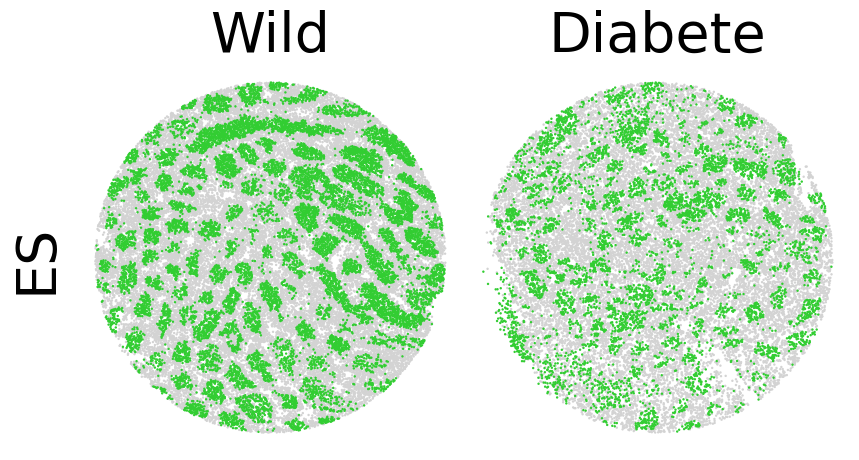

In [5]:
def draw_germ_cell_types(adata1, adata2, save_dir, cell_type):

    adata1.obs['cell_type'] = adata1.obs['ct_name'].replace(['Differentiating SPG'], ['SPG'])
    adata2.obs['cell_type'] = adata2.obs['ct_name'].replace(['Differentiating SPG'], ['SPG'])

    coords1 = np.array(adata1.obsm['spatial'])
    _coords1, _, _ =  alignment(coords1)           
    x_locs1, y_locs1 = _coords1[:,0], _coords1[:,1]

    coords2 = np.array(adata2.obsm['spatial'])
    _coords2, _, _ =  alignment(coords2)           
    x_locs2, y_locs2 = _coords2[:,0], _coords2[:,1]

    spectrum_cell_types = ['ES', 'RS', 'SPC', 'SPG']
    cell_type_pal = {'ES':'limegreen', 'RS':'darkcyan', 'SPC':'purple', 'SPG':'skyblue', 'other':'lightgray'}


    # Plot the cell types on top of positions
    fig, axs = plt.subplots(1, 2, figsize=(10,5), gridspec_kw={'hspace':0, 'wspace':0})

        
    cell_labels1, cell_labels2 = [], []
    for x in adata1.obs['cell_type']:
        cell_labels1.append(x if x == cell_type else 'other')
    for x in adata2.obs['cell_type']:
        cell_labels2.append(x if x == cell_type else 'other')

    axs[0].set_aspect(1)
    axs[1].set_aspect(1)

    tmp1 = list(zip(cell_labels1, x_locs1, y_locs1))
    tmp2 = list(zip(cell_labels2, x_locs2, y_locs2))

    for cell_t in ['other', cell_type]:
        sub_tmp1 = [i for i in tmp1 if i[0]==cell_t]
        sub_cell_labels1, sub_x_locs1, sub_y_locs1 = list(zip(*sub_tmp1))
        axs[0].scatter(x=sub_x_locs1, y=sub_y_locs1, s=3, c=cell_type_pal[cell_t], edgecolors='none')

        sub_tmp2 = [i for i in tmp2 if i[0]==cell_t]
        sub_cell_labels2, sub_x_locs2, sub_y_locs2 = list(zip(*sub_tmp2))
        axs[1].scatter(x=sub_x_locs2, y=sub_y_locs2, s=3, c=cell_type_pal[cell_t], edgecolors='none')

    for sp in axs[0].spines.values():
        sp.set_visible(False)

    for sp in axs[1].spines.values():
        sp.set_visible(False)

    axs[0].set_xticks([])
    axs[0].set_yticks([])
    axs[1].set_xticks([])
    axs[1].set_yticks([])

    axs[0].set_ylabel(cell_type, fontsize=40, labelpad=10)

    axs[0].set_title('Wild', fontsize=40, pad=10)
    axs[1].set_title('Diabete', fontsize=40, pad=10)

    plt.show()
    
    fig.savefig(os.path.join(save_dir, 'Sperm_cell_types_%s.pdf'%cell_type), bbox_inches='tight', dpi=100)
    plt.close()

draw_germ_cell_types(post_wt_adata.copy(), post_db_adata.copy(), save_dir, 'ES')

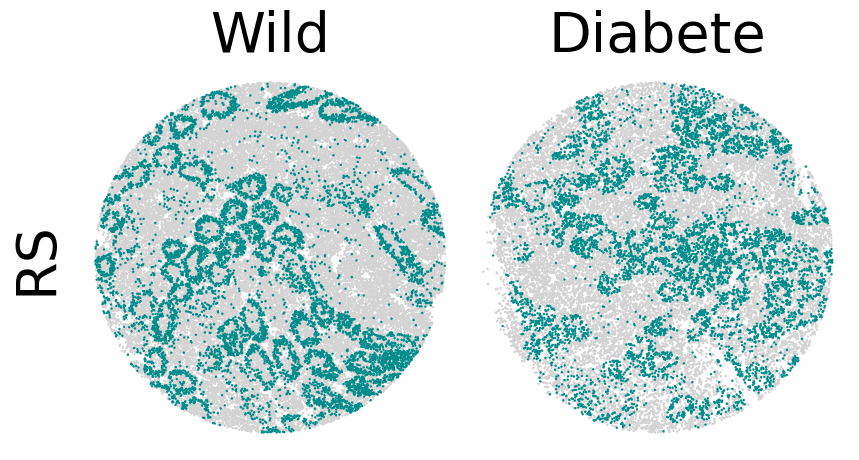

In [6]:
draw_germ_cell_types(post_wt_adata.copy(), post_db_adata.copy(), save_dir, 'RS')

In [7]:
test_df = pd.read_csv('/home/jy/rongboshen/spagda/testis/application/go_term/Testis_M1.csv')
sub_df = test_df[test_df.source=='GO:BP'][['term_name', 'adjusted_p_value']]
result_df = sub_df.set_index('term_name')
size = result_df.shape[0]
result_df['rank'] = list(range(1,size+1))
result_df

,adjusted_p_value,rank
term_name,,
spermatogenesis,1.268363e-07,1
male gamete generation,1.991278e-07,2
sexual reproduction,1.784221e-06,3
gamete generation,5.905391e-06,4
multicellular organismal reproductive process,9.883751e-06,5
multicellular organism reproduction,2.472694e-05,6
developmental process involved in reproduction,1.604884e-04,7
chaperone-mediated protein folding,6.694340e-04,8
sperm DNA condensation,1.000770e-03,9


In [8]:
for i in range(1,9):
    module_path = os.path.join('/home/jy/rongboshen/spagda/testis/application/go_term', 'Testis_M%d.csv'%i)
    module_df = pd.read_csv(module_path)
    sub_df = module_df[module_df.source=='GO:BP']
    sub_df = sub_df[['term_name', 'adjusted_p_value']].set_index('term_name')
    if i == 1:
        result_df = sub_df.copy()
        size = result_df.shape[0]
        result_df.rename(columns={'adjusted_p_value': 'M%d_adjusted_p_value'%i}, inplace=True)
        result_df['M%d_rank'%i] = list(range(1,size+1))
    else:
        sub_df.rename(columns={'adjusted_p_value': 'M%d_adjusted_p_value'%i}, inplace=True)
        size = sub_df.shape[0]
        sub_df['M%d_rank'%i] = list(range(1,size+1))        
        result_df = pd.merge(result_df, sub_df, how='outer', left_index=True, right_index=True)

all_pval = ['M%d_adjusted_p_value'%x for x in range(1,9)]

result_df = result_df.sort_values(by=all_pval)
result_df.to_csv('/home/jy/rongboshen/spagda/testis/application/go_term/bp_merged_with_m1.csv')
result_df 

,M1_adjusted_p_value,M1_rank,M2_adjusted_p_value,M2_rank,M3_adjusted_p_value,M3_rank,M4_adjusted_p_value,M4_rank,M5_adjusted_p_value,M5_rank,M6_adjusted_p_value,M6_rank,M7_adjusted_p_value,M7_rank,M8_adjusted_p_value,M8_rank
term_name,,,,,,,,,,,,,,,,
spermatogenesis,1.268363e-07,1.0,1.415899e-07,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000990,2.0
male gamete generation,1.991278e-07,2.0,4.388080e-08,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.001261,3.0
sexual reproduction,1.784221e-06,3.0,5.864715e-13,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000814,1.0
gamete generation,5.905391e-06,4.0,1.583254e-06,19.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.003404,4.0
multicellular organismal reproductive process,9.883751e-06,5.0,3.687333e-07,13.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.012272,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
nitrobenzene metabolic process,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.036288,8.0
cellular detoxification of nitrogen compound,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.048356,12.0
detoxification of nitrogen compound,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.048356,11.0


In [9]:
def calc_scc(post_wt_adata, post_db_adata, res_wt_adata, res_db_adata, shared_genes):

    ## SCC between measured genes and predicted genes.
    imputed_genes = list(set(post_wt_adata.var_names)-set(shared_genes))
    wt_scc = pd.Series(index=imputed_genes, dtype='float16', name='wild')
    wt_sparse = pd.DataFrame(index=imputed_genes, columns=['Measured', 'Imputed'], dtype='float16')

    sc.pp.normalize_total(post_wt_adata)
    sc.pp.normalize_total(res_wt_adata)

    for g in imputed_genes:
        if np.std(np.array(post_wt_adata[:,g].X).reshape(-1)) == 0:
            wt_scc[g] = 0
        else:
            wt_scc[g] = st.spearmanr(post_wt_adata[:,g].X.reshape(-1), res_wt_adata[:,g].X.reshape(-1))[0]
        
        measured_sparse = np.sum(post_wt_adata[:,g].X.reshape(-1) != 0)*1./ post_wt_adata.shape[0]
        imputed_sparse = np.sum(res_wt_adata[:,g].X.reshape(-1) != 0)*1./ res_wt_adata.shape[0]

        wt_sparse.loc[g, 'Measured'] = measured_sparse
        wt_sparse.loc[g, 'Imputed'] = imputed_sparse
        if measured_sparse == 0:
            wt_sparse.loc[g, 'diffs'] = 1e-6
        else:
            wt_sparse.loc[g, 'diffs'] = imputed_sparse / measured_sparse

    print('===> %d genes in WT with median scc: %.4f'%(wt_scc.size, wt_scc.median()))

    imputed_genes = list(set(post_db_adata.var_names)-set(shared_genes))
    db_scc = pd.Series(index = list(set(res_db_adata.var_names)-set(shared_genes)), dtype='float16', name='diabete')
    db_sparse = pd.DataFrame(index=imputed_genes, columns=['Measured', 'Imputed'], dtype='float16')

    sc.pp.normalize_total(post_db_adata)
    sc.pp.normalize_total(res_db_adata)

    for g in imputed_genes:
        if np.std(np.array(post_db_adata[:,g].X).reshape(-1)) == 0:
            db_scc[g] = 0
        else:
            db_scc[g] = st.spearmanr(post_db_adata[:,g].X.reshape(-1), res_db_adata[:,g].X.reshape(-1))[0]

        measured_sparse = np.sum(post_db_adata[:,g].X.reshape(-1) != 0)*1./ post_db_adata.shape[0]
        imputed_sparse = np.sum(res_db_adata[:,g].X.reshape(-1) != 0)*1./ res_db_adata.shape[0]

        db_sparse.loc[g, 'Measured'] = measured_sparse
        db_sparse.loc[g, 'Imputed'] = imputed_sparse

        if measured_sparse == 0:
            db_sparse.loc[g, 'diffs'] = 1e-6
        else:
            db_sparse.loc[g, 'diffs'] = imputed_sparse / measured_sparse

    print('===> %d genes in DB with median scc: %.4f'%(db_scc.size, db_scc.median()))

    return wt_scc, wt_sparse, db_scc, db_sparse

def calc_sparse(post_wt_adata, post_db_adata, res_wt_adata, res_db_adata, shared_genes):

    imputed_genes = list(set(post_wt_adata.var_names)-set(shared_genes))
    wt_sparse = pd.DataFrame(index=imputed_genes, columns=['Measured', 'Imputed'], dtype='float16')

    for g in imputed_genes:
        measured_sparse = np.sum(post_wt_adata[:,g].X.reshape(-1) != 0)*1./ post_wt_adata.shape[0]
        imputed_sparse = np.sum(res_wt_adata[:,g].X.reshape(-1) != 0)*1./ res_wt_adata.shape[0]

        wt_sparse.loc[g, 'Measured'] = measured_sparse
        wt_sparse.loc[g, 'Imputed'] = imputed_sparse
        if measured_sparse == 0:
            wt_sparse.loc[g, 'diffs'] = 1e-6
        else:
            wt_sparse.loc[g, 'diffs'] = imputed_sparse / measured_sparse

    print('===> %d genes in WT'%len(imputed_genes))

    imputed_genes = list(set(post_db_adata.var_names)-set(shared_genes))
    db_sparse = pd.DataFrame(index=imputed_genes, columns=['Measured', 'Imputed'], dtype='float16')

    for g in imputed_genes:
        measured_sparse = np.sum(post_db_adata[:,g].X.reshape(-1) != 0)*1./ post_db_adata.shape[0]
        imputed_sparse = np.sum(res_db_adata[:,g].X.reshape(-1) != 0)*1./ res_db_adata.shape[0]

        db_sparse.loc[g, 'Measured'] = measured_sparse
        db_sparse.loc[g, 'Imputed'] = imputed_sparse
        if measured_sparse == 0:
            db_sparse.loc[g, 'diffs'] = 1e-6
        else:
            db_sparse.loc[g, 'diffs'] = imputed_sparse / measured_sparse

    print('===> %d genes in DB'%len(imputed_genes))

    return wt_sparse, db_sparse


wt_sparse, db_sparse = calc_sparse(post_wt_adata.copy(), post_db_adata.copy(), 
                                   res_wt_adata.copy(), res_db_adata.copy(), shared_genes)

===> 981 genes in WT
===> 981 genes in DB


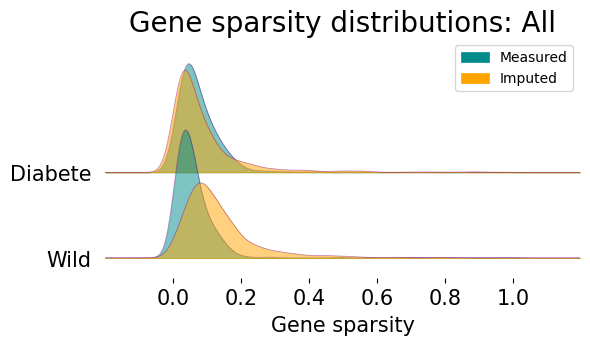

In [10]:
def draw_joyplot(wt_sparse, db_sparse, cell_type, marker_genes_list):
    wt_sparse['Sample'] = ['Wild'] * wt_sparse.shape[0]
    db_sparse['Sample'] = ['Diabete'] * db_sparse.shape[0]
    sparse_df = pd.concat([wt_sparse, db_sparse])
  
    fig, axes = joyplot(sparse_df, by='Sample', column=['Measured', 'Imputed'], figsize=(6,3), linecolor='purple', fill=True, legend=True, alpha=.5,
                        xlabelsize=15, ylabelsize=15, background='white', linewidth=.5, color=['darkcyan', 'orange']) # ylim='own'

    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    plt.xlabel('Gene sparsity', fontsize=15, labelpad=5)
    plt.title('Gene sparsity distributions: %s'%cell_type, fontsize=20, pad=5)
    plt.show()
    marker_gene_sparse_df = sparse_df[sparse_df.index.isin(marker_genes_list)]
    marker_gene_sparse_df.to_csv(os.path.join(save_dir, 'sparse_marker_genes_%s.csv'%cell_type))


# Plot gene sparse distribution
draw_joyplot(wt_sparse, db_sparse, 'All', marker_genes_list)


In [ ]:
# Plot gene sparse distribution for each cell type.
def cell_type_specific_sparsity(post_wt_adata, post_db_adata, res_wt_adata, res_db_adata, shared_genes):
    post_wt_adata.obs['cell_type'] = post_wt_adata.obs['ct_name'].replace(['Differentiating SPG'], ['SPG'])
    post_db_adata.obs['cell_type'] = post_db_adata.obs['ct_name'].replace(['Differentiating SPG'], ['SPG'])
    res_wt_adata.obs['cell_type'] = res_wt_adata.obs['ct_name'].replace(['Differentiating SPG'], ['SPG'])
    res_db_adata.obs['cell_type'] = res_db_adata.obs['ct_name'].replace(['Differentiating SPG'], ['SPG'])

    cell_types = list(set(post_wt_adata.obs['cell_type']))
    for cell_t in cell_types:
        sub_post_wt_adata = post_wt_adata[post_wt_adata.obs['cell_type']==cell_t]
        sub_post_db_adata = post_db_adata[post_db_adata.obs['cell_type']==cell_t]
        sub_res_wt_adata = res_wt_adata[res_wt_adata.obs['cell_type']==cell_t]
        sub_res_db_adata = res_db_adata[res_db_adata.obs['cell_type']==cell_t]

        sub_wt_sparse, sub_db_sparse = calc_sparse(sub_post_wt_adata, sub_post_db_adata, 
                                       sub_res_wt_adata, sub_res_db_adata, shared_genes)
        
        draw_joyplot(sub_wt_sparse, sub_db_sparse, cell_t, marker_genes_list)

cell_type_specific_sparsity(post_wt_adata.copy(), post_db_adata.copy(), 
                            res_wt_adata.copy(), res_db_adata.copy(), shared_genes)

In [11]:
cts = ['All'] + list(cell_types)
res_df1 = pd.DataFrame(index=marker_genes_list)
res_df2 = pd.DataFrame(index=marker_genes_list)
for ct in cts:
    df = pd.read_csv(os.path.join(save_dir, 'sparse_marker_genes_%s.csv'%ct), index_col=0)
    sub_df1 = df[df['Sample']=='Wild']
    sub_df2 = df[df['Sample']=='Diabete']
    tmp1 = sub_df1['Imputed'] - sub_df1['Measured']
    tmp2 = sub_df2['Imputed'] - sub_df2['Measured']   

    res_df1[ct] = tmp1
    res_df2[ct] = tmp2

res_df1.to_csv(os.path.join(save_dir, 'subtraction_sparse_marker_genes_wt.csv'))
res_df2.to_csv(os.path.join(save_dir, 'subtraction_sparse_marker_genes_db.csv'))
res_df2

,All,ES,RS,SPC,SPG,Macrophage,Endothelial,Myoid,Leydig,Sertoli
Prm1,-0.541431,-0.162839,-0.481818,-0.853458,-0.866194,-0.685484,-0.759531,-0.8256,-0.789298,-0.838710
Prm2,-0.608366,-0.185509,-0.593182,-0.897897,-0.951773,-0.758065,-0.832845,-0.9072,-0.869565,-0.927248
Tnp1,-0.360661,-0.062231,-0.199006,-0.701279,-0.694563,-0.466129,-0.565982,-0.6352,-0.628763,-0.695264
Tnp2,-0.402280,-0.098237,-0.266761,-0.692391,-0.760757,-0.550000,-0.621701,-0.7120,-0.648829,-0.728895
Tssk1,-0.129217,-0.104904,-0.068466,-0.198786,-0.187707,-0.140323,-0.196481,-0.1616,-0.160535,-0.189430
Acrv1,0.047026,0.051563,0.142045,0.014091,-0.056738,-0.035484,-0.070381,-0.0880,-0.060201,-0.035690
Spaca1,-0.054193,-0.054230,0.003125,-0.061132,-0.141371,-0.116129,-0.126100,-0.1280,-0.083612,-0.101579
Tsga8,0.114213,0.065047,0.265057,0.144375,-0.070449,0.051613,-0.067449,-0.0432,-0.070234,-0.039808
Piwil1,-0.150132,-0.193066,-0.061506,-0.103403,-0.284634,-0.211290,-0.217009,-0.2288,-0.240803,-0.238161
Pttg1,-0.045769,-0.076308,-0.026989,-0.009755,-0.065248,-0.058065,-0.073314,-0.0704,-0.053512,-0.056966


In [12]:
df1 = pd.read_csv(os.path.join(save_dir, 'wt_meta_module_score.csv'))
df2 = pd.read_csv(os.path.join(save_dir, 'db_meta_module_score.csv'))

idx = ['M%d'%x for x in range(1,9)]

cor_df = pd.DataFrame(index=idx)

tmp1, tmp2 = [], []
for ids in idx:
    rvalue, pval = st.pearsonr(df1[ids], df1['Normalized Pseudotime Pred'])
    tmp1.append(rvalue)

    rvalue, pval = st.pearsonr(df2[ids], df2['Normalized Pseudotime Pred'])
    tmp2.append(rvalue)    

cor_df['wt_all'] = tmp1
cor_df['db_all'] = tmp2
    
for cell_t in cell_types:
    sub_df1 = df1[df1.cell_type==cell_t]
    sub_df2 = df2[df2.cell_type==cell_t]

    ct_idx1 = np.array(df1.cell_type==cell_t, dtype=int)
    ct_idx2 = np.array(df2.cell_type==cell_t, dtype=int)    

    tmp1, tmp2, tmp3, tmp4 = [], [], [], []
    for ids in idx:
        rvalue, pval = st.pearsonr(sub_df1[ids], sub_df1['Normalized Pseudotime Pred'])
        tmp1.append(rvalue)

        rvalue, pval = st.pearsonr(sub_df2[ids], sub_df2['Normalized Pseudotime Pred'])
        tmp2.append(rvalue)    

        rvalue, pval = st.pearsonr(df1[ids], ct_idx1)
        tmp3.append(rvalue) 
        
        rvalue, pval = st.pearsonr(df2[ids], ct_idx2)
        tmp4.append(rvalue) 
        

    cor_df['wt_%s'%cell_t] = tmp1
    cor_df['db_%s'%cell_t] = tmp2

    cor_df['wt_bool_%s'%cell_t] = tmp3
    cor_df['db_bool_%s'%cell_t] = tmp4    


cor_df.to_csv(os.path.join(save_dir, 'cor_module_pseudotime.csv'))
cor_df


,wt_all,db_all,wt_ES,db_ES,wt_bool_ES,db_bool_ES,wt_RS,db_RS,wt_bool_RS,db_bool_RS,...,wt_bool_Myoid,db_bool_Myoid,wt_Leydig,db_Leydig,wt_bool_Leydig,db_bool_Leydig,wt_Sertoli,db_Sertoli,wt_bool_Sertoli,db_bool_Sertoli
M1,0.725142,0.638462,0.627297,0.614761,0.651760,0.630601,0.586473,0.415368,-0.192962,-0.188750,...,-0.078251,-0.077831,0.087150,0.562045,-0.039088,-0.052029,0.162195,0.254519,-0.153690,-0.156051
M2,-0.619781,-0.199785,-0.301062,-0.356073,-0.660400,-0.241107,-0.455997,0.052214,-0.007603,0.300768,...,0.114495,-0.018660,0.053750,-0.081702,0.060795,-0.014284,-0.010936,-0.044754,0.219569,0.024287
M3,-0.279850,-0.538522,-0.463506,-0.397840,-0.085587,-0.502143,-0.134884,-0.404152,0.153303,-0.135615,...,-0.011156,0.103384,0.049436,-0.460967,-0.006601,0.083748,-0.062331,-0.102835,-0.006983,0.182479
M4,-0.139893,-0.269666,-0.378439,-0.139081,0.119288,-0.294225,-0.134484,-0.297287,-0.036580,-0.165843,...,-0.025011,0.014195,-0.004611,-0.184011,-0.011448,0.023733,-0.064118,-0.015926,-0.033672,0.078346
M5,-0.502968,-0.438514,-0.538706,-0.413697,-0.443583,-0.532850,-0.228897,-0.233492,0.294543,0.145441,...,0.021058,0.013081,0.011368,-0.254905,0.005515,0.021242,-0.018768,-0.090208,0.062811,0.111639
M6,-0.589795,-0.325405,-0.451991,-0.414236,-0.662587,-0.402410,-0.433164,-0.096545,0.169444,0.311844,...,0.054359,-0.011718,0.005540,-0.187626,0.023296,-0.010970,0.029686,-0.128501,0.136061,0.044897
M7,-0.528027,0.473231,-0.469492,0.296237,-0.561824,0.445325,-0.314197,0.318011,0.270877,-0.010564,...,0.033878,-0.099143,-0.006520,0.426420,0.016397,-0.061897,-0.033779,0.155854,0.091274,-0.141876
M8,0.097025,-0.042465,-0.275102,-0.309448,0.250366,-0.004173,0.199716,0.198884,0.065694,0.224892,...,-0.033099,0.007580,0.009745,-0.057794,-0.017284,-0.009336,-0.010717,0.038797,-0.073850,-0.014687


<Axes: >

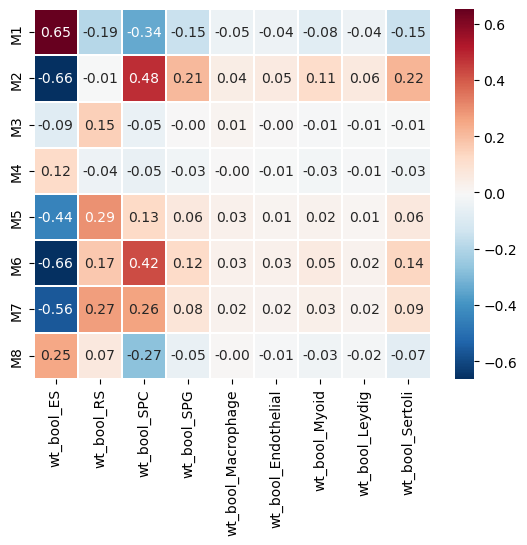

In [13]:
bool_colomns = [x for x in cor_df.columns if 'wt_bool' in x]

bool_cell_type_df = cor_df[bool_colomns]
sns.heatmap(bool_cell_type_df, annot=True, fmt=".2f", linewidths=0.1, cmap="RdBu_r")

<Axes: >

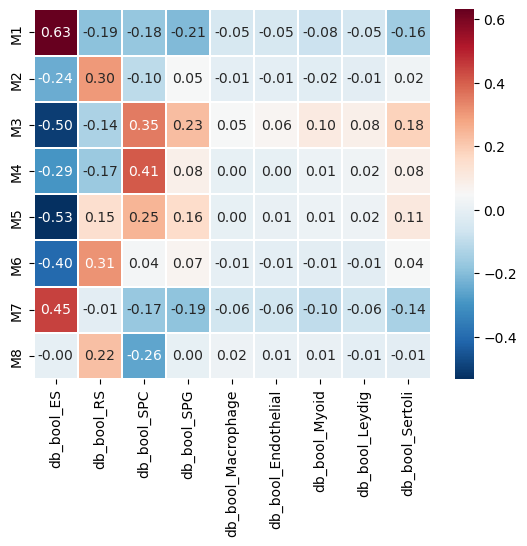

In [14]:
bool_colomns = [x for x in cor_df.columns if 'db_bool' in x]

bool_cell_type_df = cor_df[bool_colomns]
sns.heatmap(bool_cell_type_df, annot=True, fmt=".2f", linewidths=0.1, cmap="RdBu_r")

In [15]:
TF_wt = ['Atf1',
 'Atf2',
 'Atf4',
 'Creb3l4',
 'Crem',
 'Dmrt1',
 'Dmrtb1',
 'Egr1',
 'Elf2',
 'Eno1',
 'Ezh2',
 'Gtf2i',
 'Hdac2',
 'Herpud1',
 'Hoxa4',
 'Hsf2',
 'Id2',
 'Lef1',
 'Mef2a',
 'Mga',
 'Mybl1',
 'Nfic',
 'Pknox1',
 'Rfx8',
 'Rhox8',
 'Smarca5',
 'Smarcb1',
 'Smarcc1',
 'Smarcc2',
 'Smc3',
 'Sox6',
 'Sox9',
 'Spz1',
 'Stat4',
 'Tcfl5']
module_tf = pd.read_csv(os.path.join(save_dir, 'wt_module_geneset.csv'))
m1_df = module_tf[module_tf.Module==1]
tf_in_m1 = [x for x in TF_wt if x in m1_df.Gene.tolist()]
tf_in_m1

['Herpud1', 'Spz1', 'Stat4']

In [ ]:
def draw_umap(adata, shared_genes, save_dir, ext):
    sc.settings.figdir = save_dir
    adata.obs['cell_type'] = adata.obs['ct_name'].replace(['Differentiating SPG'], ['SPG'])

    print('adata shape:', adata.shape)
    spectrum_cell_types = ['ES', 'RS', 'SPC', 'SPG']

    color_palette = {'Macrophage': 'lightcyan', 'Endothelial': 'brown', 'Myoid' : 'red', 'Leydig': 'gray', 'Sertoli': 'orange',  
                     'SPG': 'skyblue', 'SPC': 'purple', 'RS': 'darkcyan', 'ES': 'limegreen', 'unassigned': 'lightgray'}

    #color_palette = {'ES': 'limegreen', 'RS': 'darkcyan', 'SPC': 'purple', 'SPG': 'skyblue'}
    #adata = adata[adata.obs.cell_type.isin(spectrum_cell_types), ~adata.var_names.isin(shared_genes)]
    print('sperm adata shape:', adata.shape) 
    sc.pp.normalize_total(adata)
    sc.pp.log1p(adata)

    sc.pp.pca(adata, n_comps=50)

    adata.obsm['X_umap'] = adata.obsm['X_pca'][:,:2]

    #sc.pp.neighbors(adata, n_pcs=2)
    #sc.tl.umap(adata)
    sc.pl.umap(adata, color='cell_type', palette=color_palette, legend_fontsize='x-small')

    return adata.uns['pca']['variance_ratio']

def draw_variance_ratio_curve(vrs1, vrs2, vrs3, vrs4, save_dir):
    # vrs1: measured, vrs2: imputed.
    # Accuracy curve, neighbor cells
    plt.style.use('seaborn-white')  
    fig, ax = plt.subplots(figsize=(10,8))
    ax.spines[['top', 'right']].set_visible(False)
    ax.spines[['bottom','left']].set_linewidth(4)

    pcs = list(range(1,51))

    vr_list1 = []
    vr_list2 = []
    vr_list3 = []
    vr_list4 = []
    tmp1, tmp2, tmp3, tmp4 = 0, 0, 0, 0
    for i in range(len(vrs1)):
        tmp1 = tmp1 + vrs1[i]
        tmp2 = tmp2 + vrs2[i]
        vr_list1.append(tmp1)
        vr_list2.append(tmp2)
        tmp3 = tmp3 + vrs3[i]
        tmp4 = tmp4 + vrs4[i]
        vr_list3.append(tmp3)
        vr_list4.append(tmp4)

    ax.plot(pcs, vr_list1, color = 'darkcyan', linewidth=4, linestyle='-', label='Wild measured')
    ax.plot(pcs, vr_list2, color = 'orange', linewidth=4, linestyle='-', label='Wild enhanced')
    ax.plot(pcs, vr_list3, color = 'darkcyan', linewidth=4, linestyle='--', label='Diabete measured')
    ax.plot(pcs, vr_list4, color = 'orange', linewidth=4, linestyle='--', label='Diabete enhanced')

    ax.tick_params(axis='x', labelsize=20, pad=5)
    ax.tick_params(axis='y', labelsize=20, pad=5)
    #ax.set_title('Accuracy (Unit: %)', fontsize=40) 
    ax.set_xlabel('Number of PCs',fontsize=30)
    ax.set_ylabel('Variance explained',fontsize=30)
    ax.set_xticks([0,10,20,30,40,50])
    ax.set_yticks([0,0.2,0.4,0.6,0.8,1.0])
    ax.legend(bbox_to_anchor=(1,0.5),loc=6, fontsize=30, borderaxespad=0)
    plt.show()

    df = pd.DataFrame()
    df['pcs'] = pcs
    df['wt_measured'] = vr_list1
    df['wt_enhanced'] = vr_list2
    df['db_measured'] = vr_list3
    df['db_enhanced'] = vr_list4

    df.to_csv(os.path.join(save_dir, 'variance_explained.csv'))


# draw umap
wt_res_vr = draw_umap(res_wt_adata.copy(), shared_genes, save_dir, 'wt_res')
db_res_vr = draw_umap(res_db_adata.copy(), shared_genes, save_dir, 'db_res')
wt_src_vr = draw_umap(post_wt_adata.copy(), shared_genes, save_dir, 'wt_src')
db_src_vr = draw_umap(post_db_adata.copy(), shared_genes, save_dir, 'db_src')
draw_variance_ratio_curve(wt_src_vr, wt_res_vr, db_src_vr, db_res_vr, save_dir)

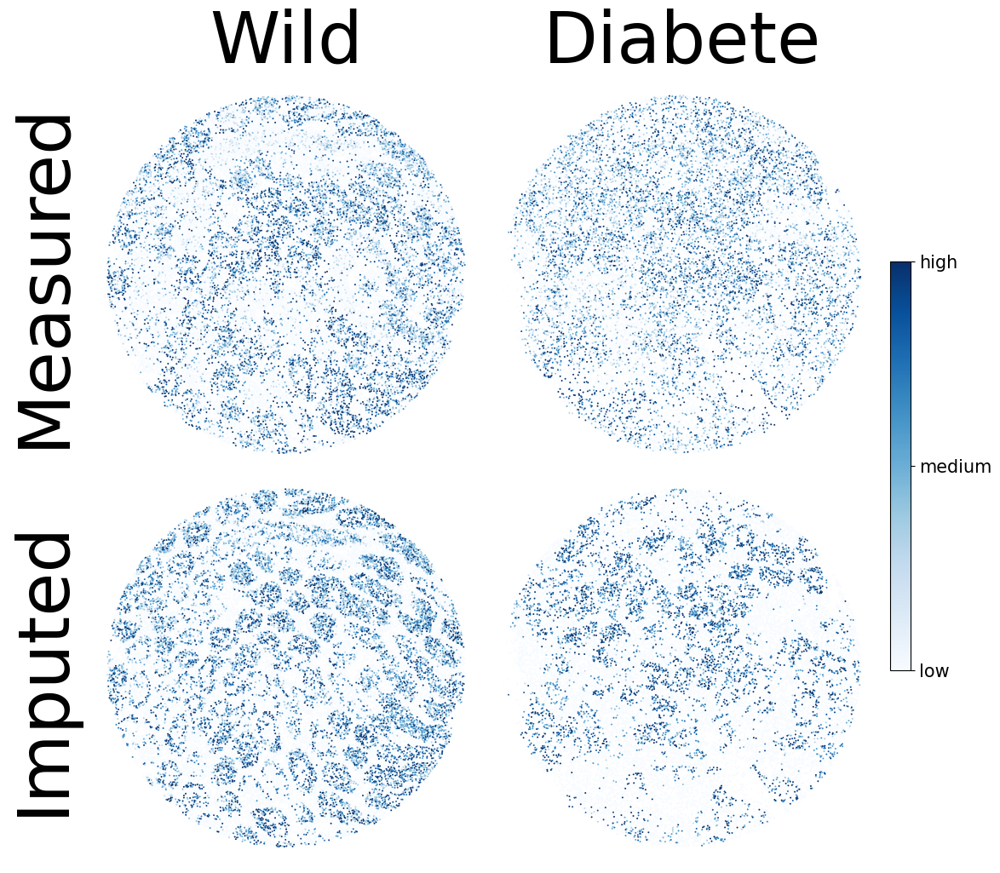

In [16]:
def draw_axs_spatial_genes2(ax, expression_values, x_locs, y_locs, title, ms, ylabel, title_color):

    ax.set_aspect(1)
    vmin = np.percentile(expression_values, 0)
    vmax = np.percentile(expression_values, 95)

    tmp = sorted(list(zip(expression_values,x_locs,y_locs)))
    expression_values, x_locs, y_locs = list(zip(*tmp))

    sca = ax.scatter(x=x_locs, y=y_locs, s=ms, c=expression_values, vmin=vmin, vmax=vmax, 
                     cmap='Blues', edgecolors='none')

    for sp in ax.spines.values():
        sp.set_visible(False)

    ax.set_xticks([])
    ax.set_yticks([])
    if ylabel: ax.set_ylabel(ylabel, fontsize=60, labelpad=10)
    if title: ax.set_title(title, color=title_color, fontsize=60, pad=10)
    return sca, vmin, vmax


def draw_demo_gene(adata1, adata2, adata3, adata4, gene, shared_genes, save_dir, ext):

    if gene in shared_genes:
        print('This gene is in shared genes, skipping...')
        return 0

    sc.pp.normalize_total(adata1)
    #sc.pp.log1p(adata1)
    sc.pp.normalize_total(adata2)
    #sc.pp.log1p(adata2)
    sc.pp.normalize_total(adata3)
    #sc.pp.log1p(adata3)
    sc.pp.normalize_total(adata4)
    #sc.pp.log1p(adata4)

    fig, axs = plt.subplots(2, 2, figsize=(12,12), gridspec_kw={'hspace':0, 'wspace':0})

    coords1 = np.array(adata1.obsm['spatial'])
    _coords1, _, _ =  alignment(coords1)           
    x_locs1, y_locs1 = _coords1[:,0], _coords1[:,1]

    coords3 = np.array(adata3.obsm['spatial'])
    _coords3, _, _ =  alignment(coords3)           
    x_locs3, y_locs3 = _coords3[:,0], _coords3[:,1]


    _, _, _ = draw_axs_spatial_genes2(axs[0,0], adata1[:,gene].X, x_locs1, y_locs1, 'Wild', 2, 'Measured', 'black')
    _, _, _ = draw_axs_spatial_genes2(axs[1,0], adata2[:,gene].X, x_locs1, y_locs1, None, 2, 'Imputed', 'black')

    _, _, _ = draw_axs_spatial_genes2(axs[0,1], adata3[:,gene].X, x_locs3, y_locs3, 'Diabete', 2, None, 'black')
    sca, vmin, vmax = draw_axs_spatial_genes2(axs[1,1], adata4[:,gene].X, x_locs3, y_locs3, None, 2, None, 'black')

    cb_ax = fig.add_axes([0.91, 0.3, 0.02, 0.4])
    cbar = fig.colorbar(sca, cax=cb_ax)
    cbar.ax.tick_params(labelsize=15)
    cbar.set_ticks([vmin, (vmin+vmax)/2, vmax])
    cbar.set_ticklabels(['low', 'medium', 'high'])
    plt.show()

# draw demo genes for all samples
draw_demo_gene(post_wt_adata.copy(), res_wt_adata.copy(), post_db_adata.copy(), res_db_adata.copy(), 
               'Tssk1', shared_genes, save_dir, 'demo_gene')

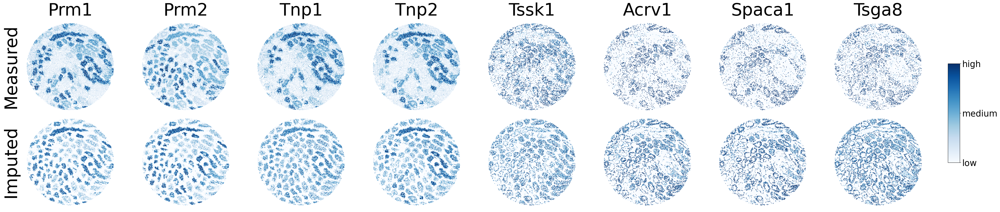

In [17]:
def draw_axs_spatial_genes3(ax, expression_values, x_locs, y_locs, title, ms, ylabel, title_color, top_percentile):

    ax.set_aspect(1)
    vmin = np.percentile(expression_values, 1)
    vmax = np.percentile(expression_values, top_percentile)

    tmp = sorted(list(zip(expression_values,x_locs,y_locs)))
    expression_values, x_locs, y_locs = list(zip(*tmp))

    sca = ax.scatter(x=x_locs, y=y_locs, s=ms, c=expression_values, vmin=vmin, vmax=vmax, 
                     cmap='Blues', edgecolors='none')

    for sp in ax.spines.values():
        sp.set_visible(False)

    ax.set_xticks([])
    ax.set_yticks([])
    if ylabel: ax.set_ylabel(ylabel, fontsize=50, labelpad=10)
    if title: ax.set_title(title, color=title_color, fontsize=50, pad=10)
    return sca, vmin, vmax

def draw_visual_genes(adata1, adata2, genes, shared_genes, save_dir, ext):

    sc.pp.normalize_total(adata1)
    #sc.pp.log1p(adata1)
    sc.pp.normalize_total(adata2)
    #sc.pp.log1p(adata2)

    genes = [x for x in genes if x in adata1.var_names]
    genes = [x for x in genes if x not in shared_genes]

    fig, axs = plt.subplots(2, len(genes), figsize=(6*len(genes),10), gridspec_kw={'hspace':0, 'wspace':0})

    coords1 = np.array(adata1.obsm['spatial'])
    _coords1, _, _ =  alignment(coords1)           
    x_locs1, y_locs1 = _coords1[:,0], _coords1[:,1]

    coords2 = np.array(adata2.obsm['spatial'])
    _coords2, _, _ =  alignment(coords2)           
    x_locs2, y_locs2 = _coords2[:,0], _coords2[:,1]

    for j,gene in enumerate(genes):
        title_color='red' if gene in shared_genes else 'black'
        if j == 0:
            sca, vmin, vmax = draw_axs_spatial_genes3(axs[0,j], adata1[:,gene].X, x_locs1, y_locs1, gene, 2, 'Measured', title_color, 99)
            sca, vmin, vmax = draw_axs_spatial_genes3(axs[1,j], adata2[:,gene].X, x_locs2, y_locs2, None, 2, 'Imputed', title_color, 99)
        elif j < 4 and j > 0:
            sca, vmin, vmax = draw_axs_spatial_genes3(axs[0,j], adata1[:,gene].X, x_locs1, y_locs1, gene, 2, None, title_color, 99)
            sca, vmin, vmax = draw_axs_spatial_genes3(axs[1,j], adata2[:,gene].X, x_locs2, y_locs2, None, 2, None, title_color, 99)
        elif j == 4:
            sca, vmin, vmax = draw_axs_spatial_genes3(axs[0,j], adata1[:,gene].X, x_locs1, y_locs1, gene, 2, None, title_color, 90)
            sca, vmin, vmax = draw_axs_spatial_genes3(axs[1,j], adata2[:,gene].X, x_locs2, y_locs2, None, 2, None, title_color, 95)            
        elif j == 5:
            sca, vmin, vmax = draw_axs_spatial_genes3(axs[0,j], adata1[:,gene].X, x_locs1, y_locs1, gene, 2, None, title_color, 90)
            sca, vmin, vmax = draw_axs_spatial_genes3(axs[1,j], adata2[:,gene].X, x_locs2, y_locs2, None, 2, None, title_color, 90)                    
        elif j == 6:
            sca, vmin, vmax = draw_axs_spatial_genes3(axs[0,j], adata1[:,gene].X, x_locs1, y_locs1, gene, 2, None, title_color, 90)
            sca, vmin, vmax = draw_axs_spatial_genes3(axs[1,j], adata2[:,gene].X, x_locs2, y_locs2, None, 2, None, title_color, 90)                    
        elif j == 7:
            sca, vmin, vmax = draw_axs_spatial_genes3(axs[0,j], adata1[:,gene].X, x_locs1, y_locs1, gene, 2, None, title_color, 90)
            sca, vmin, vmax = draw_axs_spatial_genes3(axs[1,j], adata2[:,gene].X, x_locs2, y_locs2, None, 2, None, title_color, 90)                        
            
    cb_ax = fig.add_axes([0.91, 0.3, 0.01, 0.4])
    cbar = fig.colorbar(sca, cax=cb_ax)
    cbar.ax.tick_params(labelsize=25)
    cbar.set_ticks([vmin, (vmin+vmax)/2, vmax])
    cbar.set_ticklabels(['low', 'medium', 'high'])#, fontsize=15)
    fig.savefig(os.path.join(save_dir, 'marker_genes90.pdf'), bbox_inches='tight', dpi=100)
    plt.show()


draw_visual_genes(post_wt_adata.copy(), res_wt_adata.copy(), marker_genes['ES']+marker_genes['RS'], 
                  shared_genes, save_dir, 'wt_sperm_makrer_genes')  

In [18]:
#draw_visual_genes(post_db_adata.copy(), res_db_adata.copy(), marker_genes['ES']+marker_genes['RS'], 
#                  shared_genes, save_dir, 'db_sperm_makrer_genes') 

In [19]:
#draw_demo_gene(post_wt_adata.copy(), res_wt_adata.copy(), post_db_adata.copy(), res_db_adata.copy(), 
#               'Prm1', shared_genes, save_dir, 'demo_gene')

===> cell type counts: cell_type
ES     12944
SPC     8242
RS      8240
SPG     1606
Name: count, dtype: int64
=======> ratio of selected cell types in total: 0.9052772834680125


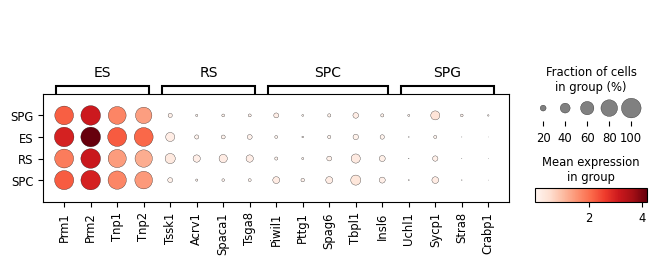

===> cell type counts: cell_type
ES     12944
SPC     8242
RS      8240
SPG     1606
Name: count, dtype: int64
=======> ratio of selected cell types in total: 0.9052772834680125


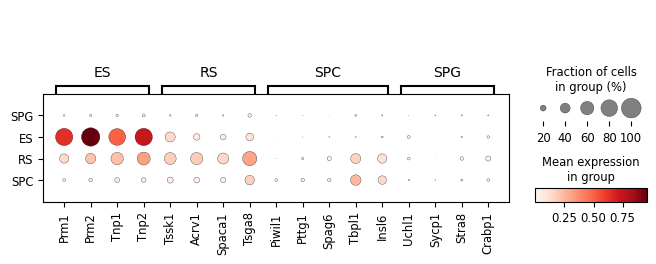

===> cell type counts: cell_type
RS     7040
ES     6749
SPC    4613
SPG    2115
Name: count, dtype: int64
=======> ratio of selected cell types in total: 0.8599270715453288


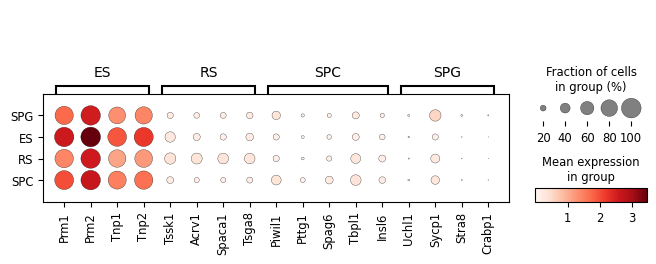

===> cell type counts: cell_type
RS     7040
ES     6749
SPC    4613
SPG    2115
Name: count, dtype: int64
=======> ratio of selected cell types in total: 0.8599270715453288


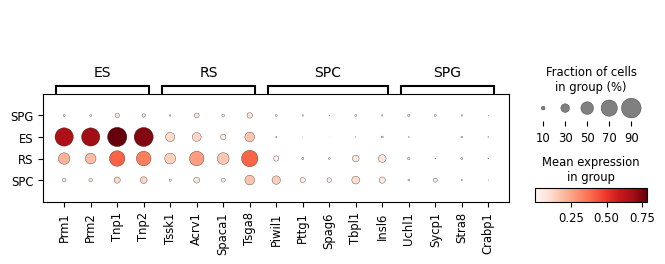

In [20]:
def draw_plots_sperm_markers(adata, markers_dict, ext, shared_genes, save_dir):
    sc.settings.figdir = save_dir

    cell_types = markers_dict.keys()

    sc.pp.normalize_total(adata)
    sc.pp.log1p(adata)
    total_cells = adata.shape[0]
    adata.obs['cell_type'] = adata.obs['ct_name'].replace(['Differentiating SPG'], ['SPG']) 
    adata = adata[adata.obs.cell_type.isin(cell_types),~adata.var_names.isin(shared_genes)]

    print('===> cell type counts:', adata.obs.cell_type.value_counts())
    print('=======> ratio of selected cell types in total:', adata.shape[0]/total_cells)

    sc.pl.dotplot(adata, markers_dict, groupby='cell_type', swap_axes=False)
    #sc.pl.stacked_violin(adata, markers_dict, groupby='cell_type', cmap='jet', swap_axes=False)#cmap='jet', 
    #sc.pl.matrixplot(adata, markers_dict, groupby='cell_type', cmap='jet', swap_axes=False)#cmap='RdBu_r'
    #sc.pl.tracksplot(adata, markers_dict, groupby='cell_type', swap_axes=False)


draw_plots_sperm_markers(post_wt_adata.copy(), deg_markers, 'src_wt', shared_genes, save_dir)
draw_plots_sperm_markers(res_wt_adata.copy(), deg_markers, 'res_wt', shared_genes, save_dir)
draw_plots_sperm_markers(post_db_adata.copy(), deg_markers, 'src_db', shared_genes, save_dir)
draw_plots_sperm_markers(res_db_adata.copy(), deg_markers, 'res_db', shared_genes, save_dir)

In [21]:
def cal_deg(adata1, adata2, markers_dict, shared_genes):

    cell_types = ['ES', 'RS', 'SPC', 'SPG']

    genes = []
    for k,v in markers_dict.items():
        genes += v

    columns = []
    for ct in cell_types:   
        columns += ['measured_fraction_in_group_%s'%ct, 
                    'measured_mean_expression_in_group_%s'%ct, 
                    'measured_count_fraction_in_group_%s'%ct,
                    'imputed_fraction_in_group_%s'%ct,
                    'imputed_mean_expression_in_group_%s'%ct,
                    'imputed_count_fraction_in_group_%s'%ct
                   ]
          
    sc.pp.normalize_total(adata1)
    sc.pp.log1p(adata1)
    total_cells = adata1.shape[0]
    adata1.obs['cell_type'] = adata1.obs['ct_name'].replace(['Differentiating SPG'], ['SPG']) 
    adata1 = adata1[adata1.obs.cell_type.isin(cell_types),~adata1.var_names.isin(shared_genes)]

    sc.pp.normalize_total(adata2)
    sc.pp.log1p(adata2)
    adata2.obs['cell_type'] = adata2.obs['ct_name'].replace(['Differentiating SPG'], ['SPG']) 
    adata2 = adata2[adata2.obs.cell_type.isin(cell_types),~adata2.var_names.isin(shared_genes)] 

    print('===> cell type counts:', adata1.obs.cell_type.value_counts())
    print('=======> ratio of selected cell types in total:', adata1.shape[0]/total_cells)

    tmp = np.zeros((len(genes), len(cell_types)*6))
    for i,g in enumerate(genes):
        total_count1 = np.sum(np.array(adata1[:,g].X))
        total_count2 = np.sum(np.array(adata2[:,g].X))
    
        for j, ct in enumerate(cell_types):
            sub_adata1 = adata1[adata1.obs.cell_type==ct,:]
            sub_adata2 = adata2[adata2.obs.cell_type==ct,:]
        
            x = np.array(sub_adata1[:,g].X)
            tmp[i,j*6] = np.sum(x>0)/sub_adata1.shape[0]
            tmp[i,j*6+1] = np.mean(x)
            tmp[i,j*6+2] = np.sum(x)/total_count1
            
            y = np.array(sub_adata2[:,g].X)
            tmp[i,j*6+3] = np.sum(y>0)/sub_adata2.shape[0]
            tmp[i,j*6+4] = np.mean(y)
            tmp[i,j*6+5] = np.sum(y)/total_count2

    deg_df = pd.DataFrame(tmp, index=genes, columns=columns)
            
    return deg_df

deg_df = cal_deg(post_wt_adata.copy(), res_wt_adata.copy(), deg_markers, shared_genes)
deg_df.to_csv(os.path.join(save_dir, 'deg_express_ratio_mean_count.csv'))
deg_df

===> cell type counts: cell_type
ES     12944
SPC     8242
RS      8240
SPG     1606
Name: count, dtype: int64
=======> ratio of selected cell types in total: 0.9052772834680125


,measured_fraction_in_group_ES,measured_mean_expression_in_group_ES,measured_count_fraction_in_group_ES,imputed_fraction_in_group_ES,imputed_mean_expression_in_group_ES,imputed_count_fraction_in_group_ES,measured_fraction_in_group_RS,measured_mean_expression_in_group_RS,measured_count_fraction_in_group_RS,imputed_fraction_in_group_RS,...,measured_count_fraction_in_group_SPC,imputed_fraction_in_group_SPC,imputed_mean_expression_in_group_SPC,imputed_count_fraction_in_group_SPC,measured_fraction_in_group_SPG,measured_mean_expression_in_group_SPG,measured_count_fraction_in_group_SPG,imputed_fraction_in_group_SPG,imputed_mean_expression_in_group_SPG,imputed_count_fraction_in_group_SPG
Prm1,0.991347,2.990960,0.509333,0.841085,0.642020,0.847316,0.951699,1.852692,0.200842,0.367597,...,0.243198,0.077408,0.035038,0.029445,0.937733,2.206809,0.046627,0.034247,0.021716,0.003556
Prm2,1.000000,4.167535,0.492343,0.915096,0.957650,0.841038,0.997209,3.151387,0.237001,0.424879,...,0.225132,0.107377,0.059967,0.033534,0.995019,3.105774,0.045524,0.054795,0.044581,0.004858
Tnp1,0.953337,2.255279,0.502893,0.806938,0.504877,0.732348,0.899029,1.444601,0.205060,0.543204,...,0.244068,0.158214,0.060972,0.056315,0.879826,1.734171,0.047978,0.061644,0.033453,0.006021
Tnp2,0.947543,2.111674,0.526723,0.845411,0.733987,0.738155,0.849272,1.233361,0.195841,0.573908,...,0.233924,0.149114,0.079303,0.050782,0.790162,1.405948,0.043511,0.081569,0.056804,0.007088
Tssk1,0.356536,0.199001,0.410571,0.410306,0.140126,0.475809,0.416990,0.309087,0.405950,0.510680,...,0.150060,0.210750,0.066766,0.144355,0.128892,0.130551,0.033419,0.035492,0.014523,0.006119
Acrv1,0.126313,0.058788,0.295389,0.228677,0.057536,0.267271,0.266505,0.171083,0.547234,0.531432,...,0.125297,0.197404,0.059801,0.176882,0.054172,0.051459,0.032081,0.056040,0.024319,0.014016
Spaca1,0.116888,0.057246,0.243102,0.188582,0.043777,0.255643,0.316869,0.214632,0.580228,0.464684,...,0.137818,0.175686,0.046464,0.172771,0.074720,0.073739,0.038853,0.031756,0.012652,0.009167
Tsga8,0.155439,0.074878,0.321605,0.286774,0.101858,0.245466,0.267961,0.176234,0.481854,0.650000,...,0.155129,0.380975,0.170438,0.261533,0.080324,0.077711,0.041412,0.104608,0.059164,0.017690
Piwil1,0.078106,0.036607,0.153803,0.000695,0.000132,0.010594,0.086650,0.057914,0.154897,0.003641,...,0.600274,0.070129,0.017914,0.914703,0.159402,0.174618,0.091025,0.006227,0.002509,0.024960
Pttg1,0.038010,0.015329,0.172432,0.004481,0.000439,0.025179,0.050728,0.031122,0.222853,0.057888,...,0.545221,0.103009,0.019115,0.698600,0.042341,0.042628,0.059493,0.004981,0.000914,0.006508


In [ ]:
def calc_ratio_mean(adata, cell_types, marker_genes_list, marker_dict):

    sc.pp.normalize_total(adata)
    sc.pp.log1p(adata)
    total_cells = adata.shape[0]
    adata.obs['cell_type'] = adata.obs['ct_name'].replace(['Differentiating SPG'], ['SPG']) 

    express_ratio_mean_df = pd.DataFrame(index=marker_genes_list)
    
    correspond_cell_types = []
    tmp1,tmp2,tmp3,tmp4 = [],[],[],[]
    gene_entropy = []
    for gene in marker_genes_list:
        print('Gene %s with ratio and mean expression:'%gene)
        for k,v in marker_dict.items():
            if gene in v:
                cell_type = k
        print('Gene %s is the marker of cell type %s'%(gene, cell_type))     
        correspond_cell_types.append(cell_type)
        sub_adata = adata[:, gene]
        x_sub_adata = sub_adata[sub_adata.obs.cell_type==cell_type,:]
        y_sub_adata = sub_adata[sub_adata.obs.cell_type!=cell_type,:]

        r1 = np.sum(x_sub_adata.X > 0) / (1.*x_sub_adata.shape[0])
        r2 = np.sum(y_sub_adata.X > 0) / (1.*y_sub_adata.shape[0])
        m1 = np.sum(x_sub_adata.X) / (1.*x_sub_adata.shape[0])
        m2 = np.sum(y_sub_adata.X) / (1.*y_sub_adata.shape[0])
        tmp1.append(r1)
        tmp2.append(r2)
        tmp3.append(m1)
        tmp4.append(m2)

        
        print('Gene %s with entropy:'%gene)
        sub_adata = adata[:, gene]
        total_value = np.sum(sub_adata.X)
        cell_type_expression_ratio = {}
        for ct in cell_types:
            tmp = np.sum(sub_adata[sub_adata.obs.cell_type==ct,:].X)
            cell_type_expression_ratio[ct] = tmp / total_value if tmp > 0 else 1e-6
        
        tt = []
        s = 0
        for k,v in cell_type_expression_ratio.items():
            entr = -v*np.log2(v)
            tt.append(entr)
            s += entr
        gene_entropy.append(s)        
             
    express_ratio_mean_df['correspond_cell_type'] = correspond_cell_types
    express_ratio_mean_df['Fraction of cells expressing in corresponding cell type'] = tmp1
    express_ratio_mean_df['Fraction of cells expressing in other cell type'] = tmp2
    express_ratio_mean_df['Averaged expression in corresponding cell type'] = tmp3
    express_ratio_mean_df['Averaged expression in other cell type'] = tmp4      
    express_ratio_mean_df['Entropy'] = gene_entropy

    return express_ratio_mean_df  

pwt_express_ratio_mean_df = calc_ratio_mean(post_wt_adata.copy(), cell_types, marker_genes_list, marker_genes)
rwt_express_ratio_mean_df = calc_ratio_mean(res_wt_adata.copy(), cell_types, marker_genes_list, marker_genes)
pdb_express_ratio_mean_df = calc_ratio_mean(post_db_adata.copy(), cell_types, marker_genes_list, marker_genes)
rdb_express_ratio_mean_df = calc_ratio_mean(res_db_adata.copy(), cell_types, marker_genes_list, marker_genes)

pwt_express_ratio_mean_df.to_csv(os.path.join(save_dir, 'pwt_express_ratio_mean.csv'))
rwt_express_ratio_mean_df.to_csv(os.path.join(save_dir, 'rwt_express_ratio_mean.csv'))
pdb_express_ratio_mean_df.to_csv(os.path.join(save_dir, 'pdb_express_ratio_mean.csv'))
rdb_express_ratio_mean_df.to_csv(os.path.join(save_dir, 'rdb_express_ratio_mean.csv'))

In [22]:
ref_adata = sc.read('/home/jy/rongboshen/spagda/testis/application/data/testes_benchmark.h5ad')

In [23]:
ref_adata.obs['cell_type'] = ref_adata.obs.type_names.replace(['STids', 'Scytes', 'Elongating'], ['RS', 'SPC', 'ES'])

In [24]:
ref_adata.obs['type_names'].value_counts()
ref_adata = ref_adata[ref_adata.obs.cell_type.isin(cell_types)]

In [25]:
ref_adata.obs.cell_type.value_counts()

cell_type
RS             9766
SPC            8720
ES             6368
SPG            3646
Sertoli        1124
Leydig          297
Endothelial     176
Macrophage      136
Myoid            39
Name: count, dtype: int64

In [ ]:
def calc_ratio_mean_raw(adata, cell_types, marker_genes_list, marker_dict):

    total_cells = adata.shape[0]
    express_ratio_mean_df = pd.DataFrame(index=marker_genes_list)
    
    correspond_cell_types = []
    tmp1,tmp2,tmp3,tmp4 = [],[],[],[]
    gene_entropy = []
    for gene in marker_genes_list:
        print('Gene %s with ratio and mean expression:'%gene)
        for k,v in marker_dict.items():
            if gene in v:
                cell_type = k
        print('Gene %s is the marker of cell type %s'%(gene, cell_type))     
        correspond_cell_types.append(cell_type)
        sub_adata = adata[:, gene]
        x_sub_adata = sub_adata[sub_adata.obs.cell_type==cell_type,:]
        y_sub_adata = sub_adata[sub_adata.obs.cell_type!=cell_type,:]

        r1 = np.sum(x_sub_adata.X > 0) / (1.*x_sub_adata.shape[0])
        r2 = np.sum(y_sub_adata.X > 0) / (1.*y_sub_adata.shape[0])
        m1 = np.sum(x_sub_adata.X) / (1.*x_sub_adata.shape[0])
        m2 = np.sum(y_sub_adata.X) / (1.*y_sub_adata.shape[0])
        tmp1.append(r1)
        tmp2.append(r2)
        tmp3.append(m1)
        tmp4.append(m2)

        
        print('Gene %s with entropy:'%gene)
        sub_adata = adata[:, gene]
        total_value = np.sum(sub_adata.X)
        cell_type_expression_ratio = {}
        for ct in cell_types:
            tmp = np.sum(sub_adata[sub_adata.obs.cell_type==ct,:].X)
            cell_type_expression_ratio[ct] = tmp / total_value if tmp > 0 else 1e-6
        
        tt = []
        s = 0
        for k,v in cell_type_expression_ratio.items():
            entr = -v*np.log2(v)
            tt.append(entr)
            s += entr
        gene_entropy.append(s)        
             
    express_ratio_mean_df['correspond_cell_type'] = correspond_cell_types
    express_ratio_mean_df['Fraction of cells expressing in corresponding cell type'] = tmp1
    express_ratio_mean_df['Fraction of cells expressing in other cell type'] = tmp2
    express_ratio_mean_df['Averaged expression in corresponding cell type'] = tmp3
    express_ratio_mean_df['Averaged expression in other cell type'] = tmp4      
    express_ratio_mean_df['Entropy'] = gene_entropy

    return express_ratio_mean_df  

raw_express_ratio_mean_df = calc_ratio_mean_raw(ref_adata.copy(), cell_types, marker_genes_list, marker_genes)

In [26]:
#raw_express_ratio_mean_df.to_csv(os.path.join(save_dir, 'raw_express_ratio_mean.csv'))
#raw_express_ratio_mean_df

In [27]:
def static_cell_type(adata):
    adata.obs['cell_type'] = adata.obs['ct_name'].replace(['Differentiating SPG'], ['SPG']) 
    print('===> cell type counts:', adata.obs.cell_type.value_counts())
    return adata.obs.cell_type.value_counts()

y1 = static_cell_type(post_wt_adata.copy())
y2 = static_cell_type(post_db_adata.copy())

===> cell type counts: cell_type
ES             12944
SPC             8242
RS              8240
SPG             1606
Sertoli         1431
Myoid            793
Macrophage       608
Endothelial      298
Leydig           117
Name: count, dtype: int64
===> cell type counts: cell_type
RS             7040
ES             6749
SPC            4613
SPG            2115
Sertoli        1457
Myoid           625
Macrophage      620
Endothelial     341
Leydig          299
Name: count, dtype: int64


In [28]:
xx = ref_adata.obs.cell_type.value_counts()
xx

cell_type
RS             9766
SPC            8720
ES             6368
SPG            3646
Sertoli        1124
Leydig          297
Endothelial     176
Macrophage      136
Myoid            39
Name: count, dtype: int64

In [29]:
z = pd.DataFrame(index=cell_types)
z['ref'] = xx
z['wt'] = y1
z['db'] = y2
z.to_csv(os.path.join(save_dir, 'cell_counts.csv'))

In [30]:
#gene entropy

def calc_gene_entropy(adata, cell_types, marker_genes_list):
    sc.settings.figdir = save_dir

    sc.pp.normalize_total(adata)
    # use or nor use log1p? 
    sc.pp.log1p(adata)
    total_cells = adata.shape[0]
    adata.obs['cell_type'] = adata.obs['ct_name'].replace(['Differentiating SPG'], ['SPG']) 

    gene_entropy = []
    
    for gene in marker_genes_list:
        #print('Gene %s with entropy:'%gene)
        sub_adata = adata[:, gene]
        total_value = np.sum(sub_adata.X)
        cell_type_expression_ratio = {}
        for ct in cell_types:
            tmp = np.sum(sub_adata[sub_adata.obs.cell_type==ct,:].X)
            cell_type_expression_ratio[ct] = tmp / total_value if tmp > 0 else 1e-6
        
        tt = []
        s = 0
        for k,v in cell_type_expression_ratio.items():
            entr = -v*np.log2(v)
            tt.append(entr)
            s += entr

        #print(tt)
        gene_entropy.append(s)

    return gene_entropy

pwt_gene_entropy = calc_gene_entropy(post_wt_adata.copy(), cell_types, marker_genes_list)
rwt_gene_entropy = calc_gene_entropy(res_wt_adata.copy(), cell_types, marker_genes_list)
pdb_gene_entropy = calc_gene_entropy(post_db_adata.copy(), cell_types, marker_genes_list)
rdb_gene_entropy = calc_gene_entropy(res_db_adata.copy(), cell_types, marker_genes_list)

gene_entropy_df = pd.DataFrame(index=marker_genes_list)
gene_entropy_df['src_wt'] = pwt_gene_entropy
gene_entropy_df['res_wt'] = rwt_gene_entropy
gene_entropy_df['src_db'] = pdb_gene_entropy
gene_entropy_df['res_db'] = rdb_gene_entropy

gene_entropy_df.to_csv(os.path.join(save_dir, 'gene_entropy.csv'))
gene_entropy_df


,src_wt,res_wt,src_db,res_db
Prm1,2.125649,0.917177,2.426137,1.396769
Prm2,2.135086,0.964914,2.436800,1.313634
Tnp1,2.133423,1.260616,2.437072,1.698553
Tnp2,2.081499,1.277586,2.411801,1.662160
Tssk1,2.047276,1.683241,2.260911,1.515254
Acrv1,1.930949,1.775342,2.253423,1.941032
Spaca1,1.952819,1.705399,2.236440,1.677955
Tsga8,2.097611,1.893560,2.358034,1.973912
Piwil1,2.184497,1.018925,2.619201,1.628044
Pttg1,2.234195,1.239098,2.545575,1.479583


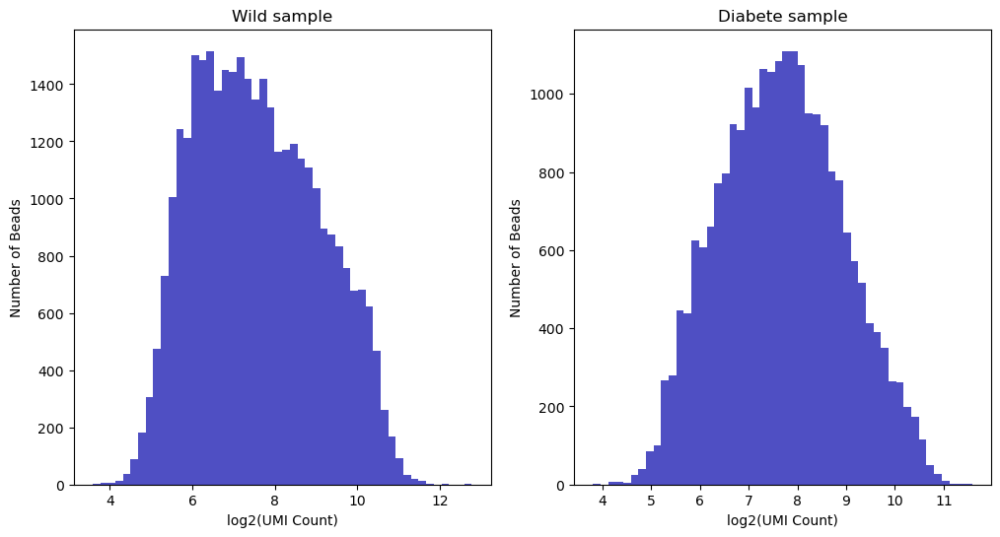

(177.0, 203.0)

In [31]:
negative_gene_to_coefficient_dict = {'mt-Nd1': 2.240772116330779,   # wt module 2, db module 3
                                     'Tuba3b': 20.0,                # wt module 6, db module 4
                                     'Stmn1': 4.661355144844998,    # wt module -1, db module 4
                                     'Cypt4': 2.914946084728282,    # wt module 8, db module 8
                                     'mt-Cytb': 7.940721195057547,  # wt module 2, db module 3
                                     'Hsp90aa1': 7.719926741335844} # wt module 6, db module 3
positive_gene_to_coefficient_dict = {'Tnp2': 2.2300113564016115,    # wt module 1, db module 1
                                     'Smcp': 20.0,                  # wt module 1, db module 1
                                     'Gsg1': 10.749147113890643,    # wt module 1, db module 1
                                     'Oaz3': 13.684470608169942,    # wt module 1, db module 1
                                     'Hmgb4': 11.19717467780924,    # wt module 1, db module 1
                                     'Lyar': 3.205774497366639,     # wt module 6, db module 4
                                     'Prm1': 1.8021648809899742,    # wt module 1, db module 1
                                     'Dbil5': 2.4081140269931445}   # wt module 1, db module 1
total_counts_wild = np.sum(res_wt_adata.X, axis=1)
total_counts_diabete = np.sum(res_db_adata.X, axis=1)

b1 = np.log2(total_counts_wild)
b2 = np.log2(total_counts_diabete)

fig, axs = plt.subplots(1, 2, figsize=(12, 6), gridspec_kw={'wspace':0.2})

axs[0].hist(x=b1, color='#0504aa', bins= 50, alpha=0.7)
axs[0].set_xlabel('log2(UMI Count)')
axs[0].set_ylabel('Number of Beads')
axs[0].set_title('Wild sample')

axs[1].hist(x=b2, color='#0504aa', bins= 50, alpha=0.7)
axs[1].set_xlabel('log2(UMI Count)')
axs[1].set_ylabel('Number of Beads')
axs[1].set_title('Diabete sample')

plt.show()

np.median(total_counts_wild), np.median(total_counts_diabete)

In [32]:
res_wt_adata.obs['Pseudotime Pred'] = 0
res_db_adata.obs['Pseudotime Pred'] = 0
for i in negative_gene_to_coefficient_dict:
    res_wt_adata.obs['Pseudotime Pred'] = res_wt_adata.obs['Pseudotime Pred'] + \
                                          res_wt_adata[:,i].X.flatten() * negative_gene_to_coefficient_dict[i]
    res_db_adata.obs['Pseudotime Pred'] = res_db_adata.obs['Pseudotime Pred'] + \
                                          res_db_adata[:,i].X.flatten() * negative_gene_to_coefficient_dict[i]
    
for j in positive_gene_to_coefficient_dict:
    res_wt_adata.obs['Pseudotime Pred'] = res_wt_adata.obs['Pseudotime Pred'] + \
                                          res_wt_adata[:,j].X.flatten() * positive_gene_to_coefficient_dict[j]
    res_db_adata.obs['Pseudotime Pred'] = res_db_adata.obs['Pseudotime Pred'] + \
                                          res_db_adata[:,j].X.flatten() * positive_gene_to_coefficient_dict[j]

res_wt_adata.obs['total_counts_pred'] = total_counts_wild
res_db_adata.obs['total_counts_pred'] = total_counts_diabete
res_wt_adata.obs['Normalized Pseudotime Pred'] = res_wt_adata.obs['Pseudotime Pred'] / res_wt_adata.obs['total_counts_pred']
res_db_adata.obs['Normalized Pseudotime Pred'] = res_db_adata.obs['Pseudotime Pred'] / res_db_adata.obs['total_counts_pred']
res_wt_adata.obs

,ct,ct_name,Pseudotime,total_counts,Normalized Pseudotime,xcoord_int,ycoord_int,Cluster,tubules,n_genes,n_counts,n_genes_by_counts,total_counts_mt,pct_counts_mt,Pseudotime Pred,total_counts_pred,Normalized Pseudotime Pred
AGCTCACCAGACCG,1,ES,5536.623686,7013,0.420876,177,190,204,204,2913,13155.0,2911,19.0,0.144454,1748.225298,6999.0,0.249782
TATGCACCAACTTT,1,ES,3753.319822,6956,0.340129,198,175,0,226,3203,11035.0,3198,18.0,0.163191,1222.282439,6941.0,0.176096
TTGGCCGACTCAGC,1,ES,1953.639482,2039,0.316687,36,108,1,1,2590,6169.0,2588,9.0,0.145938,611.382299,2038.0,0.299991
AACACCGACTACTA,2,RS,1896.705610,4680,0.287816,119,117,0,90,2517,6590.0,2511,13.0,0.197448,762.030293,4672.0,0.163106
TACCTGTCAGCGAA,1,ES,3747.114887,2140,0.584118,124,194,117,117,1719,6415.0,1716,21.0,0.327511,841.627514,2138.0,0.393652
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TCACTTTCCAGCTT,6,Sertoli,53.045887,37,0.162220,91,112,0,71,303,327.0,303,1.0,0.305810,0.000000,37.0,0.000000
ATCTATAGGAGGCG,1,ES,191.884277,99,0.497110,143,149,142,142,275,386.0,275,0.0,0.000000,16.342133,99.0,0.165072
TCTCTACGGCGTGG,4,SPC,53.274412,64,0.147575,124,156,0,121,325,361.0,325,1.0,0.277008,0.000000,64.0,0.000000
AGACAATTGTAGAA,5,Differentiating SPG,29.485590,44,0.079476,147,197,0,134,329,371.0,329,14.0,3.773585,0.000000,44.0,0.000000


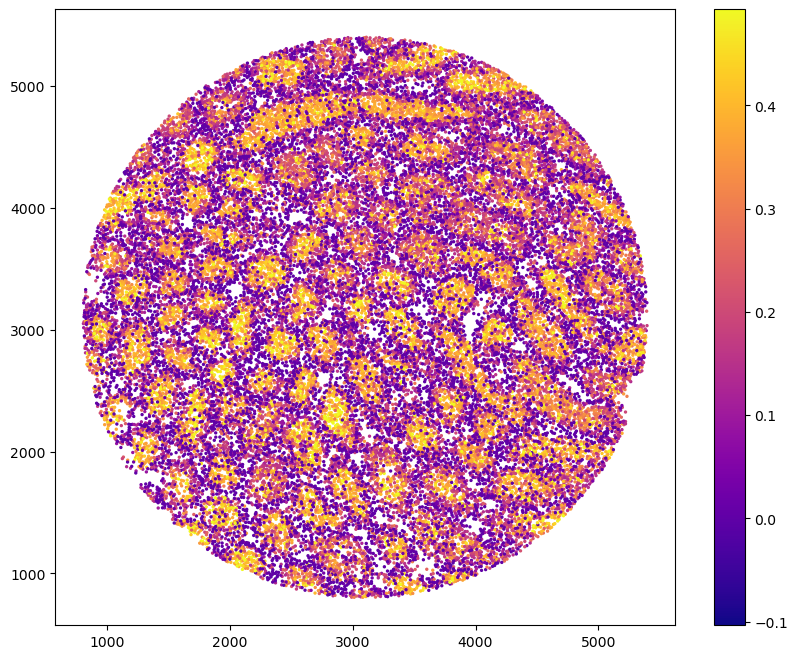

In [33]:
res_wt_adata.obsm['spatial_plus_pseudo'] = np.concatenate([res_wt_adata.obsm['spatial'], np.array(res_wt_adata.obs['Normalized Pseudotime Pred']*np.median(total_counts_wild)).reshape(-1,1)], axis=1)
res_db_adata.obsm['spatial_plus_pseudo'] = np.concatenate([res_db_adata.obsm['spatial'], np.array(res_db_adata.obs['Normalized Pseudotime Pred']*np.median(total_counts_diabete)).reshape(-1,1)], axis=1)

pseudotime_std_dev = float(res_wt_adata.obs['Normalized Pseudotime Pred'].describe()['std'])
pseudotime_mean = float(res_wt_adata.obs['Normalized Pseudotime Pred'].describe()['mean'])
vmin_wild = pseudotime_mean - 2*pseudotime_std_dev
vmax_wild = pseudotime_mean + 2*pseudotime_std_dev

fig = plt.figure(figsize=(10,8))
plt.scatter(res_wt_adata.obsm['spatial'][:,0], res_wt_adata.obsm['spatial'][:,1], 
                c = res_wt_adata.obs['Normalized Pseudotime Pred'], s = 2, cmap='plasma',
                vmin = vmin_wild, vmax = vmax_wild)
plt.colorbar()
plt.show()

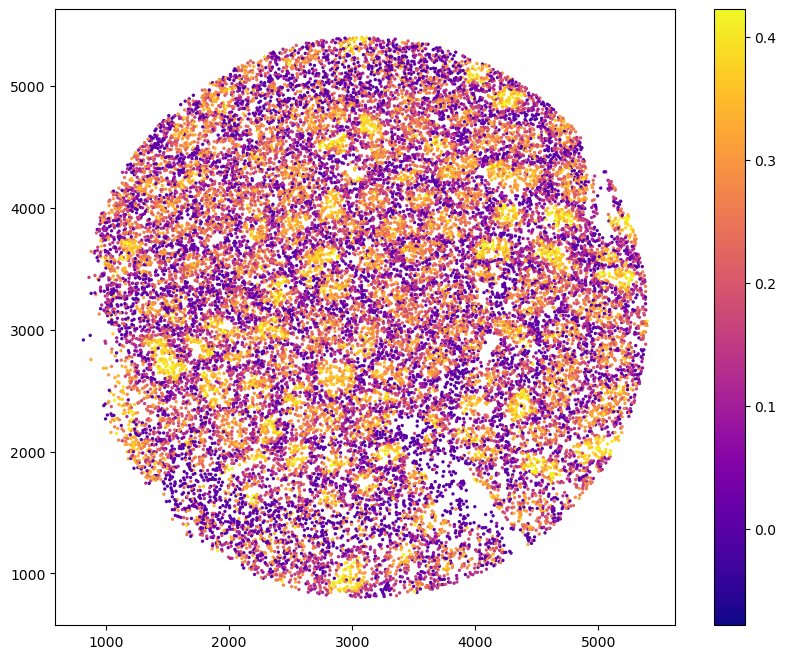

In [34]:
pseudotime_std_dev = float(res_db_adata.obs['Normalized Pseudotime Pred'].describe()['std'])
pseudotime_mean = float(res_db_adata.obs['Normalized Pseudotime Pred'].describe()['mean'])
vmin_diabete = pseudotime_mean - 2*pseudotime_std_dev
vmax_diabete = pseudotime_mean + 2*pseudotime_std_dev

fig = plt.figure(figsize=(10,8))
plt.scatter(res_db_adata.obsm['spatial'][:,0], res_db_adata.obsm['spatial'][:,1], 
                c = res_db_adata.obs['Normalized Pseudotime Pred'], s = 2, cmap='plasma',
                vmin = vmin_diabete, vmax = vmax_diabete)
plt.colorbar()
plt.show()

In [ ]:
import hotspot
import math
def correlation_plot(local_correlation_z, modules, linkage, mod_cmap='tab20', 
                     vmin=-8, vmax=8, z_cmap='RdBu_r', yticklabels=False): 
    row_colors = None
    colors = list(plt.get_cmap(mod_cmap).colors)
    module_colors = {i: colors[(i-1) % len(colors)] for i in modules.unique()}
    module_colors[-1] = '#ffffff'

    row_colors1 = pd.Series(
        [module_colors[i] for i in modules],
        index=local_correlation_z.index,
    )

    row_colors = pd.DataFrame({
        "Modules": row_colors1,
    })

    cm = sns.clustermap(local_correlation_z, row_linkage=linkage, col_linkage=linkage, 
                        vmin=vmin, vmax=vmax, cmap=z_cmap,
                        xticklabels=False, yticklabels=yticklabels, row_colors=row_colors, 
                        rasterized=True, cbar_pos=(1.02, 0.2, 0.03, 0.2))

    genes_list = modules.index.to_list()
    module_list = list(modules)
    genes, _modules = [], []
    for ind in cm.dendrogram_row.reordered_ind:
        genes.append(genes_list[ind])
        _modules.append(module_list[ind])

    reorder_df = pd.DataFrame()
    reorder_df['reorder_ind'] = cm.dendrogram_row.reordered_ind
    reorder_df['gene'] = genes
    reorder_df['modules'] = _modules

    reorder_df.to_csv(os.path.join(save_dir, 'modules_reorder.csv')) 
    
    fig = plt.gcf()
    plt.sca(cm.ax_heatmap)
    plt.ylabel("")
    plt.xlabel("")

    cm.ax_row_dendrogram.remove()
    cm.ax_col_dendrogram.remove()

    # Add 'module X' annotations
    ii = leaves_list(linkage)

    mod_reordered = modules.iloc[ii]

    mod_map = {}
    y = np.arange(modules.size)

    for x in mod_reordered.unique():
        if x == -1:
            continue

        mod_map[x] = y[mod_reordered == x].mean()

    plt.sca(cm.ax_row_colors)
    for mod, mod_y in mod_map.items():
        plt.text(-.5, y=mod_y, s="M{}".format(mod), fontsize='xx-large',
                 horizontalalignment='right',
                 verticalalignment='center')
    plt.xticks([])

    # Find the colorbar 'child' and modify
    min_delta = 1e99
    min_aa = None
    for aa in fig.get_children():
        try:
            bbox = aa.get_position()
            delta = (0-bbox.xmin)**2 + (1-bbox.ymax)**2
            if delta < min_delta:
                delta = min_delta
                min_aa = aa
        except AttributeError:
            pass

    min_aa.set_ylabel('Z-Scores')
    min_aa.yaxis.set_label_position("left")
    plt.show()


def spatial_pattern( adata, neighbors=30, min_genes=30, fdr=0.05, core=True, samp='wt'):

    adata.layers['counts'] = adata.X
    filter_genes = adata[:, np.sum(adata.X, axis=0) == 0].var_names.tolist()
    adata = adata[:, ~adata.var_names.isin(filter_genes)]
    adata.obs['total_counts'] = list(np.sum(adata.X, axis=1))


    hs = hotspot.Hotspot(adata, layer_key='counts', model='danb', 
                         latent_obsm_key='spatial_plus_pseudo', umi_counts_obs_key='total_counts')
    hs.create_knn_graph(weighted_graph=False, n_neighbors=neighbors)
    hs_results = hs.compute_autocorrelations()
    hs_genes = hs_results.loc[hs_results.FDR < 0.05].index
    local_correlations = hs.compute_local_correlations(hs_genes, jobs=8)
    modules = hs.create_modules(min_gene_threshold=min_genes, core_only=core, fdr_threshold=fdr)

    module_scores = hs.calculate_module_scores()

    correlation_plot(local_correlation_z=hs.local_correlation_z, modules=hs.modules, linkage=hs.linkage)

    columns = math.ceil(hs.modules.max()/2.)
    fig, axs = plt.subplots(2, columns, figsize=(5*columns,10), 
                            gridspec_kw={'hspace':0.2, 'wspace':0.2})
    for module in range(1, hs.modules.max()+1):
        adata.obs['M%d'%module] = hs.module_scores[module]
        rvalue, pval = st.pearsonr(hs.module_scores[module], adata.obs['Normalized Pseudotime Pred'])
        print("==> Module %d: coof %.4f and pval %.4f"%(module, rvalue, pval))

        row_idx, col_idx = int((module-1)/columns), int((module-1)%columns)
        
        axs[row_idx, col_idx].spines[['top', 'right']].set_visible(False)

        axs[row_idx, col_idx].set_ylabel('M%d'%module, fontsize=10, labelpad=5)
        axs[row_idx, col_idx].set_xlabel('Normalized Pseudotime', fontsize=10, labelpad=5)       
        axs[row_idx, col_idx].scatter(adata.obs['Normalized Pseudotime Pred'], hs.module_scores[module], 
                                      c = 'blue', s = 1)
    plt.show()

    adata.obs['cell_type'] = adata.obs['ct_name'].replace(['Differentiating SPG'], ['SPG'])
    
    df = adata.obs.copy()
    df.to_csv(os.path.join(save_dir, '%s_meta_module_score.csv'%samp))

    # Plot the module scores on top of positions
    coords = np.array(adata.obsm['spatial'])
    _coords, _, _ =  alignment(coords)
    x_locs, y_locs = _coords[:,0], _coords[:,1]

    fig, axs = plt.subplots(1, hs.modules.max(), figsize=(5*hs.modules.max(),7), 
                            gridspec_kw={'hspace':0.0, 'wspace':0.1})
    for j, module in enumerate(['M%d'%x for x in range(1, hs.modules.max()+1)]):
        sca, vmin, vmax = draw_axs_spatial_genes(axs[j], adata.obs[module], 
                                                 x_locs, y_locs, module, 2, None, 'black')

    cb_ax = fig.add_axes([0.91, 0.35, 0.01, 0.3])
    cbar = fig.colorbar(sca, cax=cb_ax)
    cbar.ax.tick_params(labelsize=15)
    cbar.set_ticks([vmin, (vmin+vmax)/2, vmax])
    cbar.set_ticklabels(['low', 'medium', 'high'])#, fontsize=15)
    plt.show()
    
    results = hs.results.join(hs.modules)
    return results.sort_values(by='Z', ascending=False)


wr_result_df = spatial_pattern(res_wt_adata.copy(), min_genes=60, neighbors=30, samp='wt')
wr_result_df.to_csv(os.path.join(save_dir, 'wt_module_geneset.csv'))

100%|██████████| 1373/1373 [00:09<00:00, 138.26it/s]


Computing pair-wise local correlation on 1370 features...


100%|██████████| 937765/937765 [05:54<00:00, 2648.23it/s]


Computing scores for 8 modules...


 62%|██████▎   | 5/8 [00:04<00:02,  1.12it/s]

/home/jy/JYuan/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/tmp/ipykernel_3381647/1384335662.py:77: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['total_counts'] = list(np.sum(adata.X, axis=1))
100%|██████████| 1373/1373 [00:05<00:00, 231.25it/s]
/home/jy/JYuan/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Computing pair-wise local correlation on 1350 features...


100%|██████████| 910575/910575 [03:27<00:00, 4396.32it/s]


Computing scores for 8 modules...


 12%|█▎        | 1/8 [00:00<00:04,  1.66it/s]/home/jy/JYuan/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
 25%|██▌       | 2/8 [00:01<00:03,  1.51it/s]/home/jy/JYuan/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
 38%|███▊      | 3/8 [00:02<00:03,  1.42it/s]/home/jy/JYuan/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
 50%|█████     | 4/8 [00:02<00:02,  1.80it/s]/home/jy/JYuan/m

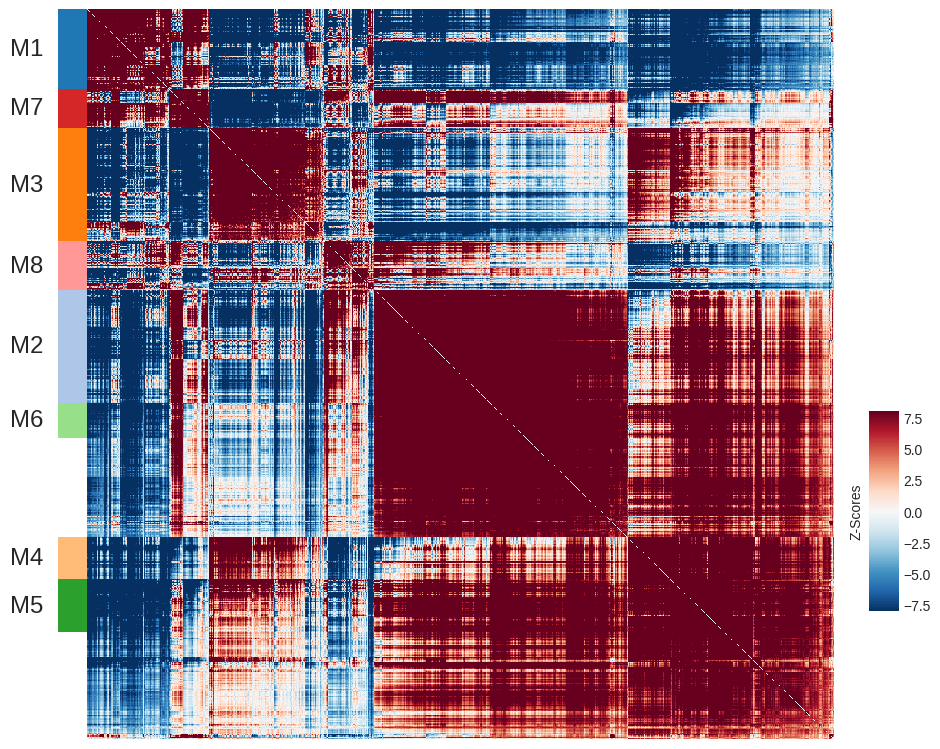

==> Module 1: coof 0.6385 and pval 0.0000
==> Module 2: coof -0.1998 and pval 0.0000
==> Module 3: coof -0.5385 and pval 0.0000
==> Module 4: coof -0.2697 and pval 0.0000
==> Module 5: coof -0.4385 and pval 0.0000
==> Module 6: coof -0.3254 and pval 0.0000
==> Module 7: coof 0.4732 and pval 0.0000
==> Module 8: coof -0.0425 and pval 0.0000


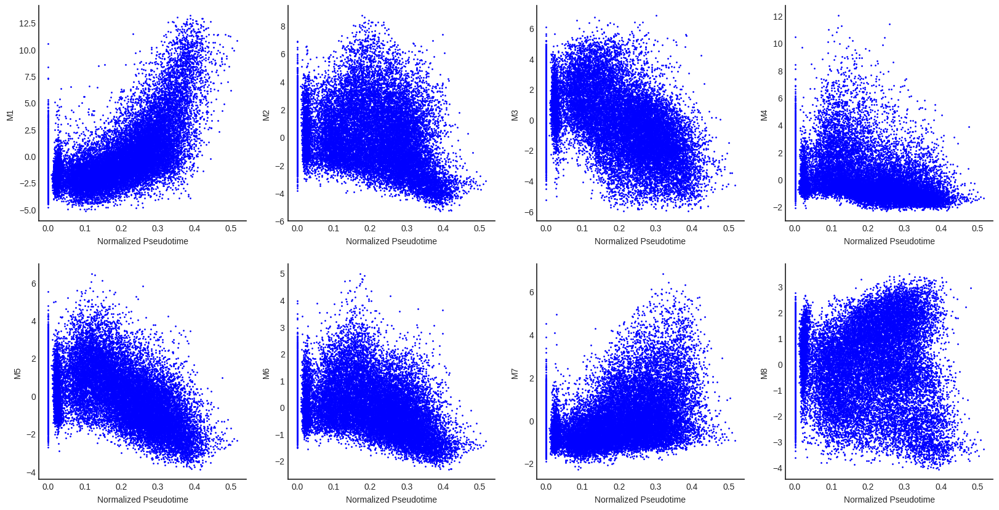

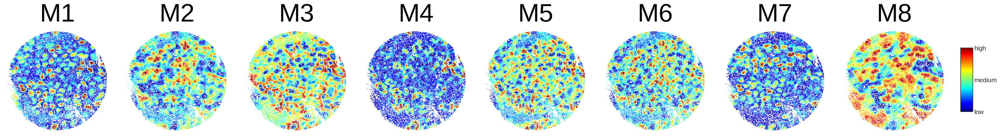

In [30]:
#dr_result_df = spatial_pattern(res_db_adata.copy(), min_genes=60, neighbors=30, samp='db')
#dr_result_df.to_csv(os.path.join(save_dir, 'db_module_geneset.csv'))